In [1]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
import seaborn as sns
#from ydata_profiling import ProfileReport
from pylab import rcParams
import statsmodels.api as sm
import matplotlib
import itertools

In [2]:
df = pd.read_csv('sensors.csv')
df.head()

,Unnamed: 0,created_at,PM1.0_CF1_ug/m3,PM2.5_CF1_ug/m3,PM10.0_CF1_ug/m3,UptimeMinutes,ADC,Pressure_hpa,PM2.5_ATM_ug/m3,>=0.3um/dl,...,>=5.0um/dl,>=10.0um/dl,lat,long,sensor,RSSI_dbm,Temperature_F,Humidity_%,PM1.0_ATM_ug/m3,PM10_ATM_ug/m3
0,0,2021-01-01 00:00:00 UTC,0.24,0.88,1.74,18139.20,0.02,1019.76,0.88,214.18,...,1.31,0.27,-33.847175,151.210579,Milson,NaN,NaN,NaN,NaN,NaN
1,1,2021-01-01 00:30:00 UTC,0.13,0.73,1.44,18131.73,0.02,1019.62,0.73,187.86,...,1.17,0.21,-33.847175,151.210579,Milson,NaN,NaN,NaN,NaN,NaN
2,2,2021-01-01 01:00:00 UTC,0.04,0.50,0.93,18116.80,0.02,1019.64,0.50,154.70,...,0.53,0.04,-33.847175,151.210579,Milson,NaN,NaN,NaN,NaN,NaN
3,3,2021-01-01 01:30:00 UTC,0.37,1.17,2.01,18128.00,0.02,1019.40,1.17,259.11,...,1.32,0.16,-33.847175,151.210579,Milson,NaN,NaN,NaN,NaN,NaN
4,4,2021-01-01 02:00:00 UTC,0.18,0.80,1.32,18083.20,0.02,1019.27,0.80,194.20,...,0.65,0.15,-33.847175,151.210579,Milson,NaN,NaN,NaN,NaN,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53641 entries, 0 to 53640
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        53641 non-null  int64  
 1   created_at        53641 non-null  object 
 2   PM1.0_CF1_ug/m3   53324 non-null  float64
 3   PM2.5_CF1_ug/m3   53324 non-null  float64
 4   PM10.0_CF1_ug/m3  53324 non-null  float64
 5   UptimeMinutes     53324 non-null  float64
 6   ADC               26334 non-null  float64
 7   Pressure_hpa      24446 non-null  float64
 8   PM2.5_ATM_ug/m3   53324 non-null  float64
 9   >=0.3um/dl        52620 non-null  float64
 10  >=0.5um/dl        52620 non-null  float64
 11  >1.0um/dl         52620 non-null  float64
 12  >=2.5um/dl        52620 non-null  float64
 13  >=5.0um/dl        52620 non-null  float64
 14  >=10.0um/dl       52620 non-null  float64
 15  lat               53641 non-null  float64
 16  long              53641 non-null  float6

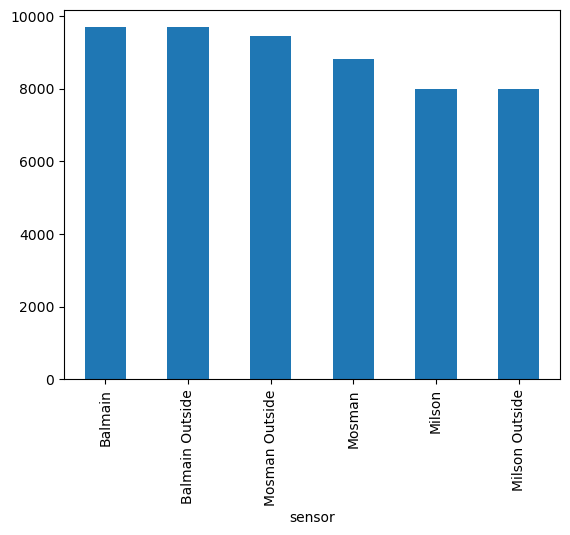

In [4]:
df.sensor.value_counts().plot.bar()
plt.show()

In [5]:
# Summary statistics
print(df.describe())

         Unnamed: 0  PM1.0_CF1_ug/m3  PM2.5_CF1_ug/m3  PM10.0_CF1_ug/m3  \
count  53641.000000     53324.000000     53324.000000      53324.000000   
mean    4499.161835         5.207023         7.944821          9.030701   
std     2630.572013        10.879080        16.333363         17.251418   
min        0.000000         0.000000         0.000000          0.000000   
25%     2235.000000         0.630000         1.570000          2.300000   
50%     4470.000000         1.940000         3.460000          4.560000   
75%     6705.000000         5.860000         8.390000          9.530000   
max     9686.000000       205.270000       293.780000        311.690000   

       UptimeMinutes           ADC  Pressure_hpa  PM2.5_ATM_ug/m3  \
count   53324.000000  26334.000000  24446.000000     53324.000000   
mean    16510.850190      0.034479   1012.725337         7.305733   
std      8995.357197      0.019541      9.193598        11.980805   
min         3.000000      0.010000    405.700000

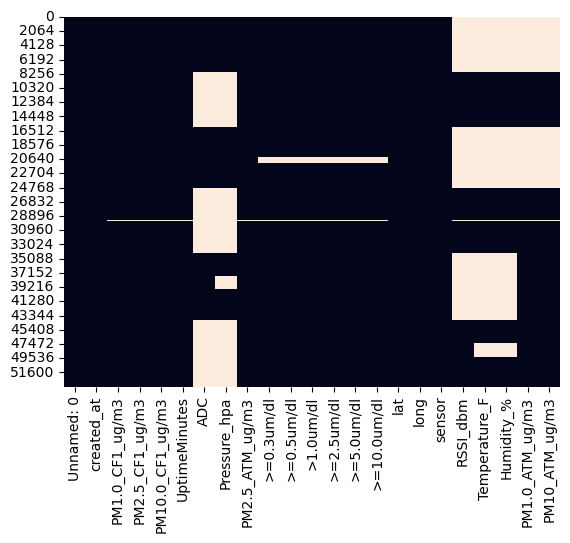

In [6]:
# Visualize missing values
sns.heatmap(df.isnull(), cbar=False)
plt.show()

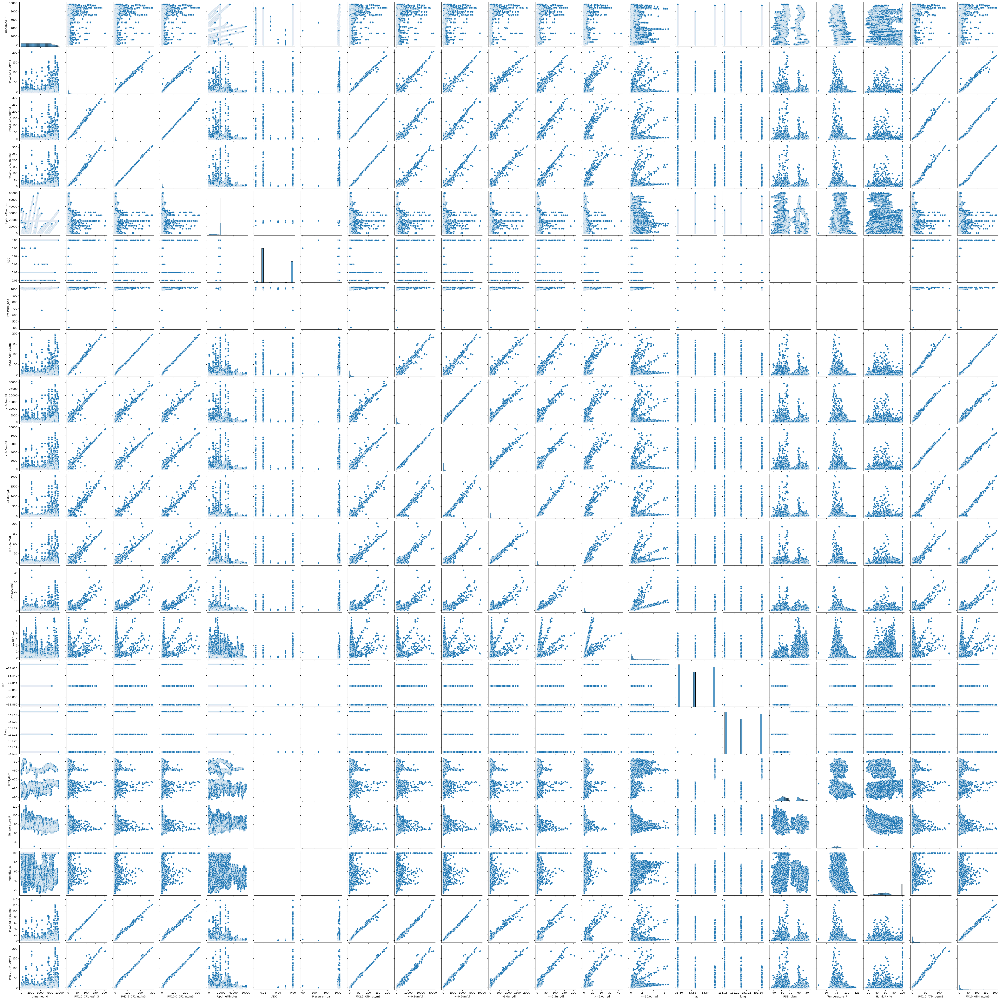

In [7]:
# Pairplot to analyze relationships
sns.pairplot(df)
plt.show()

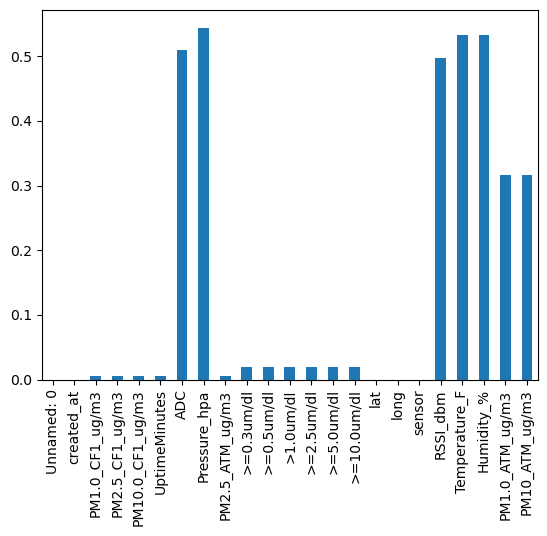

In [8]:
(df.isnull().sum() / len(df)).plot.bar()
plt.show()

In [9]:
value_vars = ['PM1.0_CF1_ug/m3', 'PM2.5_CF1_ug/m3', 'PM10.0_CF1_ug/m3', 'ADC', 'Pressure_hpa', 'PM2.5_ATM_ug/m3', '>=0.3um/dl',
       '>=0.5um/dl', '>1.0um/dl', '>=2.5um/dl', '>=5.0um/dl', '>=10.0um/dl',
       'PM1.0_ATM_ug/m3', 'PM10_ATM_ug/m3',
       'RSSI_dbm', 'Temperature_F', 'Humidity_%']
df_melted = df.melt(id_vars=['sensor', 'created_at'], value_vars=value_vars, var_name="Param", value_name="Value")

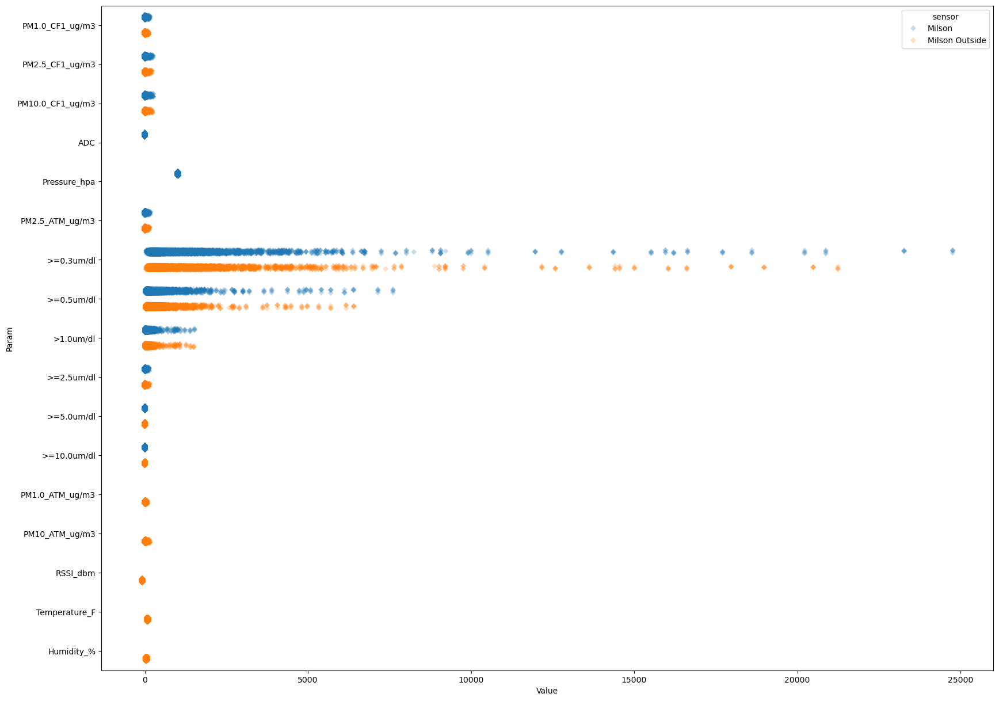

In [10]:
fig_dims = (20, 15)
fig, ax = plt.subplots(figsize=fig_dims)
sns.stripplot(y = 'Param', x = 'Value', data = df_melted[df_melted.sensor.isin(['Milson', 'Milson Outside'])], jitter = True, marker = 'D', dodge = True, alpha = 0.25, hue = 'sensor', ax = ax)
plt.show()

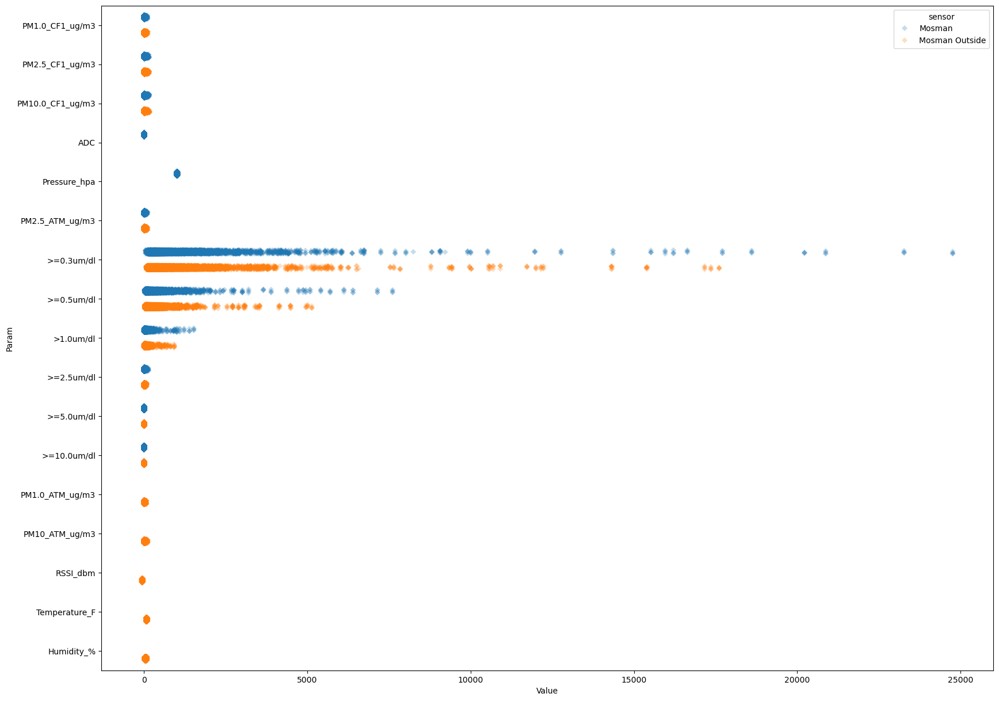

In [11]:
fig_dims = (20, 15)
fig, ax = plt.subplots(figsize=fig_dims)
sns.stripplot(y = 'Param', x = 'Value', data = df_melted[df_melted.sensor.isin(['Mosman', 'Mosman Outside'])], jitter = True, marker = 'D', dodge = True, alpha = 0.25, hue = 'sensor', ax = ax)
plt.show()

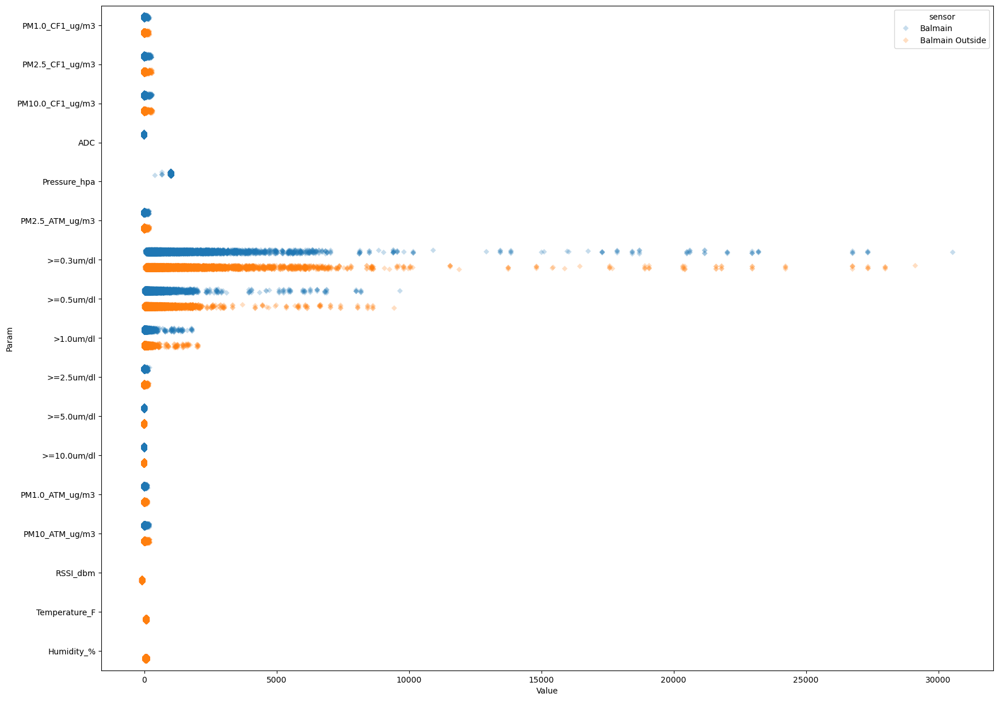

In [12]:
fig_dims = (20, 15)
fig, ax = plt.subplots(figsize=fig_dims)
sns.stripplot(y = 'Param', x = 'Value', data = df_melted[df_melted.sensor.isin(['Balmain', 'Balmain Outside'])], jitter = True, marker = 'D', dodge = True, alpha = 0.25, hue = 'sensor', ax = ax)
plt.show()

In [15]:
df_gb = df.groupby(['sensor', 'lat', 'long'], as_index=False)[df.select_dtypes(include=np.number).columns].mean()
df_gb.head()


,sensor,Unnamed: 0,PM1.0_CF1_ug/m3,PM2.5_CF1_ug/m3,PM10.0_CF1_ug/m3,UptimeMinutes,ADC,Pressure_hpa,PM2.5_ATM_ug/m3,>=0.3um/dl,...,>=2.5um/dl,>=5.0um/dl,>=10.0um/dl,lat,long,RSSI_dbm,Temperature_F,Humidity_%,PM1.0_ATM_ug/m3,PM10_ATM_ug/m3
0,Balmain,4843.0,5.607580,8.638273,9.928383,18317.854550,0.059981,1013.956255,7.907030,1140.934529,...,6.755735,2.091662,0.363237,-33.860263,151.182855,NaN,NaN,NaN,5.107262,9.327212
1,Balmain Outside,4843.0,6.361603,9.116371,10.361602,14958.309859,NaN,NaN,8.278141,1249.418287,...,6.076181,1.678433,0.321399,-33.860263,151.182855,-76.270781,75.600508,89.586046,5.717708,9.673259
2,Milson,3999.0,5.212612,8.249505,9.133509,18350.518660,0.020311,1015.663990,7.535317,1043.102371,...,6.193154,1.178378,0.177995,-33.847175,151.210579,NaN,NaN,NaN,NaN,NaN
3,Milson Outside,3999.0,4.968740,7.542510,8.095359,13782.565210,NaN,NaN,6.936314,1053.074405,...,3.699092,0.757133,0.146575,-33.847175,151.210579,-80.822663,76.611699,49.986203,4.590130,7.616212
4,Mosman,4404.5,4.365241,6.816352,7.979569,18546.304802,0.019071,1008.915065,6.359119,1043.837865,...,6.196722,1.178836,0.178043,-33.832318,151.245973,NaN,NaN,NaN,NaN,NaN


In [18]:
df_gb_loc = df.groupby(['lat', 'long'], as_index=False)[df.select_dtypes(include=np.number).columns].mean()
df_gb_loc.head()


,Unnamed: 0,PM1.0_CF1_ug/m3,PM2.5_CF1_ug/m3,PM10.0_CF1_ug/m3,UptimeMinutes,ADC,Pressure_hpa,PM2.5_ATM_ug/m3,>=0.3um/dl,>=0.5um/dl,...,>=2.5um/dl,>=5.0um/dl,>=10.0um/dl,lat,long,RSSI_dbm,Temperature_F,Humidity_%,PM1.0_ATM_ug/m3,PM10_ATM_ug/m3
0,4843.000000,5.984611,8.877334,10.145003,16637.995408,0.059981,1013.956255,8.092595,1195.176408,342.343112,...,6.415958,1.885048,0.342318,-33.860263,151.182855,-76.270781,75.600508,89.586046,5.412485,9.500236
1,3999.000000,5.090661,7.895964,8.614369,16066.255937,0.020311,1015.663990,7.235778,1048.088700,307.441866,...,4.946045,0.967743,0.162284,-33.847175,151.210579,-80.822663,76.611699,49.986203,4.590130,7.616212
2,4572.513876,4.474199,6.985513,8.202019,16768.665514,0.019071,1008.915065,6.521756,1012.204440,292.325278,...,6.191033,1.352822,0.613744,-33.832318,151.245973,-57.582646,75.657171,50.753154,4.244773,8.043099


In [19]:
df_gb_loc.head()

,Unnamed: 0,PM1.0_CF1_ug/m3,PM2.5_CF1_ug/m3,PM10.0_CF1_ug/m3,UptimeMinutes,ADC,Pressure_hpa,PM2.5_ATM_ug/m3,>=0.3um/dl,>=0.5um/dl,...,>=2.5um/dl,>=5.0um/dl,>=10.0um/dl,lat,long,RSSI_dbm,Temperature_F,Humidity_%,PM1.0_ATM_ug/m3,PM10_ATM_ug/m3
0,4843.000000,5.984611,8.877334,10.145003,16637.995408,0.059981,1013.956255,8.092595,1195.176408,342.343112,...,6.415958,1.885048,0.342318,-33.860263,151.182855,-76.270781,75.600508,89.586046,5.412485,9.500236
1,3999.000000,5.090661,7.895964,8.614369,16066.255937,0.020311,1015.663990,7.235778,1048.088700,307.441866,...,4.946045,0.967743,0.162284,-33.847175,151.210579,-80.822663,76.611699,49.986203,4.590130,7.616212
2,4572.513876,4.474199,6.985513,8.202019,16768.665514,0.019071,1008.915065,6.521756,1012.204440,292.325278,...,6.191033,1.352822,0.613744,-33.832318,151.245973,-57.582646,75.657171,50.753154,4.244773,8.043099


In [20]:
df_gb_loc[df_gb_loc.lat == -33.832318]['PM2.5_CF1_ug/m3'][2]*10

69.85513084060226

In [21]:
m=folium.Map(location=[-33.8559799094,151.20666584], zoom_start=13)
folium.CircleMarker(location=[-33.860263,151.182855], radius=df_gb_loc[df_gb_loc.lat == -33.860263]['PM2.5_CF1_ug/m3'][0]*10, popup="Balmain", color="#3186cc", fill=True, fill_color="#3186cc").add_to(m)
folium.CircleMarker(location=[-33.847175,151.210579], radius=df_gb_loc[df_gb_loc.lat == -33.847175]['PM2.5_CF1_ug/m3'][1]*10, popup="Milsons", color="crimson", fill=True, fill_color="crimson").add_to(m)
folium.CircleMarker(location=[-33.832318,151.245973	], radius=df_gb_loc[df_gb_loc.lat == -33.832318]['PM2.5_CF1_ug/m3'][2]*10, popup="Mosman", color="teal", fill=True, fill_color="teal").add_to(m)
m

In [22]:
m1=folium.Map(location=[-33.860263,151.182855], zoom_start=17)
folium.CircleMarker(location=[-33.860263,151.182855], radius=df_gb_loc[df_gb_loc.lat == -33.860263]['PM2.5_CF1_ug/m3'][0]*10, popup="Balmain", color="#3186cc", fill=True, fill_color="#3186cc").add_to(m1)
m1

In [23]:
m2=folium.Map(location=[-33.847175,151.210579], zoom_start=17)
folium.CircleMarker(location=[-33.847175,151.210579], radius=df_gb_loc[df_gb_loc.lat == -33.847175]['PM2.5_CF1_ug/m3'][1]*10, popup="Milsons", color="crimson", fill=True, fill_color="crimson").add_to(m2)
m2

In [24]:
m3=folium.Map(location=[-33.832318,151.245973	], zoom_start=17)
folium.CircleMarker(location=[-33.832318,151.245973	], radius=df_gb_loc[df_gb_loc.lat == -33.832318]['PM2.5_CF1_ug/m3'][2]*10, popup="Mosman", color="teal", fill=True, fill_color="teal").add_to(m3)
m3

In [25]:
grouped = df.groupby(df.sensor)

Milson = grouped.get_group("Milson")
milson_df= pd.DataFrame(Milson)

drop_cols = ['RSSI_dbm','Temperature_F','Humidity_%']
milson_df.drop(drop_cols, inplace=True, axis=1)


Milson_outside = grouped.get_group("Milson Outside")
milson_outside_df = pd.DataFrame(Milson_outside)

drop_cols = ['ADC','Pressure_hpa']
milson_outside_df.drop(drop_cols, inplace=True, axis=1)


Mosman = grouped.get_group("Mosman")
mosman_df = pd.DataFrame(Mosman)

drop_cols = ['RSSI_dbm','Temperature_F','Humidity_%']
mosman_df.drop(drop_cols, inplace=True, axis=1)


mosman_outside = grouped.get_group("Mosman Outside")
mosman_outside_df = pd.DataFrame(mosman_outside)

drop_cols = ['ADC','Pressure_hpa']
mosman_outside_df.drop(drop_cols, inplace=True, axis=1)


Balmain = grouped.get_group("Balmain")
balmain_df = pd.DataFrame(Balmain)

drop_cols = ['RSSI_dbm','Temperature_F','Humidity_%']
balmain_df.drop(drop_cols, inplace=True, axis=1)




balmain_outside = grouped.get_group("Balmain Outside")
balmain_outside_df = pd.DataFrame(balmain_outside)

drop_cols = ['ADC','Pressure_hpa']
balmain_outside_df.drop(drop_cols, inplace=True, axis=1)

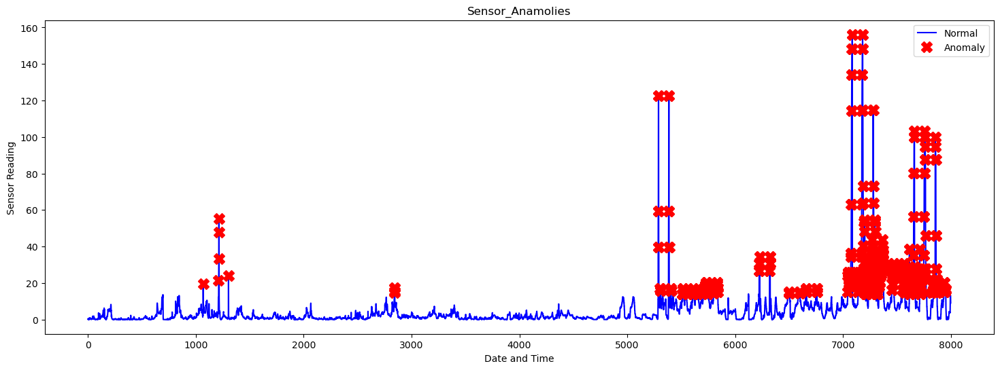

In [26]:
df_list=[milson_df,milson_outside_df,mosman_df,mosman_outside_df,balmain_df,balmain_outside_df]

q1_pc1, q3_pc1 = milson_df['PM1.0_CF1_ug/m3'].quantile([0.25, 0.75])
iqr_pc1 = q3_pc1 - q1_pc1
# Calculate upper and lower bounds for outlier for pc1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)
# Filter out the outliers from the pc1
milson_df['anomaly_pc1'] = ((milson_df['PM1.0_CF1_ug/m3']>upper_pc1) | (milson_df['PM1.0_CF1_ug/m3']<lower_pc1)).astype('int')
# Calculate IQR for the 2nd principal component (pc2)
q1_pc2, q3_pc2 = milson_df['PM2.5_CF1_ug/m3'].quantile([0.25, 0.75])
iqr_pc2 = q3_pc2 - q1_pc2
# Calculate upper and lower bounds for outlier for pc2
lower_pc2 = q1_pc2 - (1.5*iqr_pc2)
upper_pc2 = q3_pc2 + (1.5*iqr_pc2)
# Filter out the outliers from the pc2
df['anomaly_pc2'] = ((df['PM2.5_CF1_ug/m3']>upper_pc2) | (df['PM2.5_CF1_ug/m3']<lower_pc2)).astype('int')
# Let's plot the outliers from pc1 on top of the sensor_11 and see where they occured in the time series
a = milson_df[milson_df['anomaly_pc1'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(milson_df['PM1.0_CF1_ug/m3'], color='blue', label='Normal')
_ = plt.plot(a['PM1.0_CF1_ug/m3'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_Anamolies')
_ = plt.legend(loc='best')

milson_df.drop(['anomaly_pc1'],axis=1)
plt.show();


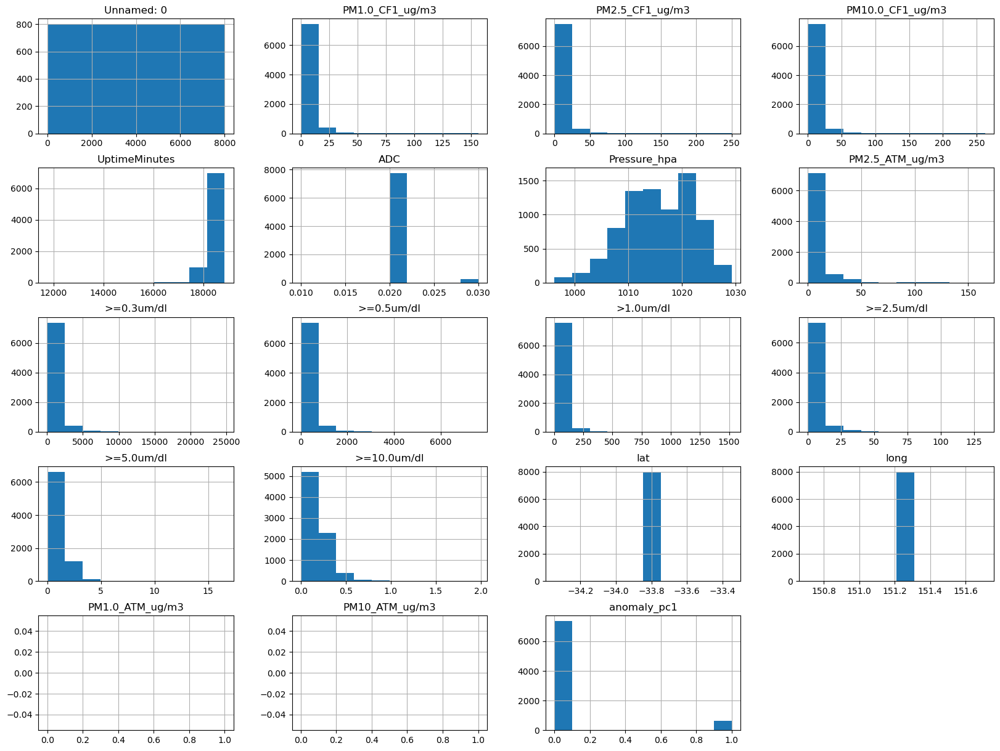

In [27]:
milson_df.hist(bins=10, figsize = (20,15))
plt.show()

In [29]:
for df_iter in df_list:
    num_columns = [elem for elem in list(df_iter.columns) if elem not in ['sensor', 'UptimeMinutes', 'lat', 'long', 'created_at', "ADC"]]

    for i in num_columns:
        q1, q3 = df_iter[i].quantile([0.25, 0.75])
        iqr = q3 - q1
        lower = q1 - (1.5 * iqr)
        upper = q3 + (1.5 * iqr)

        series_outlier = ((df_iter[i] > upper) | (df_iter[i] < lower)).astype(int)
        index_outlier = series_outlier[series_outlier == 1].index

        df_iter.loc[index_outlier, i] = np.nan 


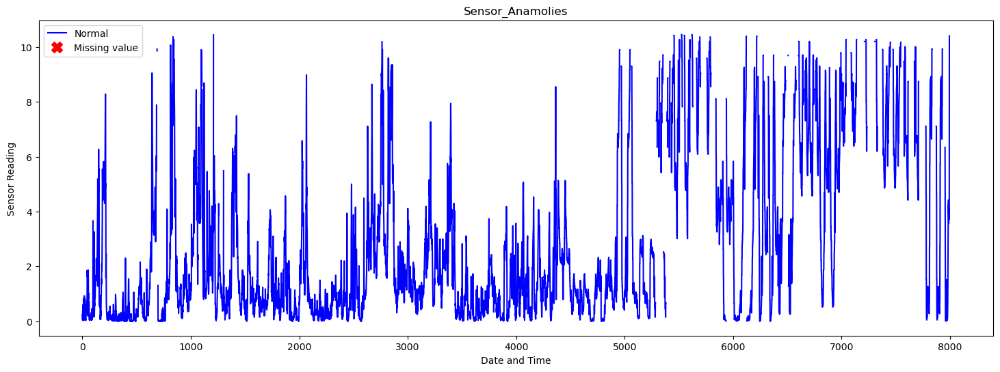

In [30]:
a = milson_df[milson_df['PM1.0_CF1_ug/m3'] == np.nan] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(milson_df['PM1.0_CF1_ug/m3'], color='blue', label='Normal')
_ = plt.plot(a['PM1.0_CF1_ug/m3'], linestyle='none', marker='X', color='red', markersize=12, label='Missing value')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_Anamolies')
_ = plt.legend(loc='best')

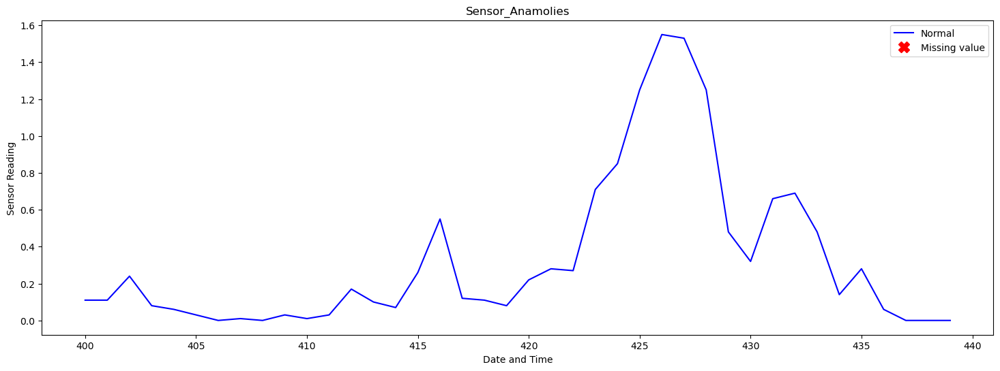

In [31]:
a = milson_df[milson_df['PM1.0_ATM_ug/m3'] == np.nan][400:440] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(milson_df['PM1.0_CF1_ug/m3'][400:440], color='blue', label='Normal')
_ = plt.plot(a['PM1.0_CF1_ug/m3'], linestyle='none', marker='X', color='red', markersize=12, label='Missing value')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_Anamolies')
_ = plt.legend(loc='best')
plt.show();

In [34]:
for df_iter in df_list:
    df_iter.index = pd.DatetimeIndex(df_iter['created_at'])  # Ensure datetime index

    col = [elem for elem in df_iter.columns if elem not in ['sensor', 'UptimeMinutes', 'lat', 'long', 'created_at', "ADC"]]
    
    for column in col:
        df_iter.loc[:, column] = df_iter[column].interpolate('time')  

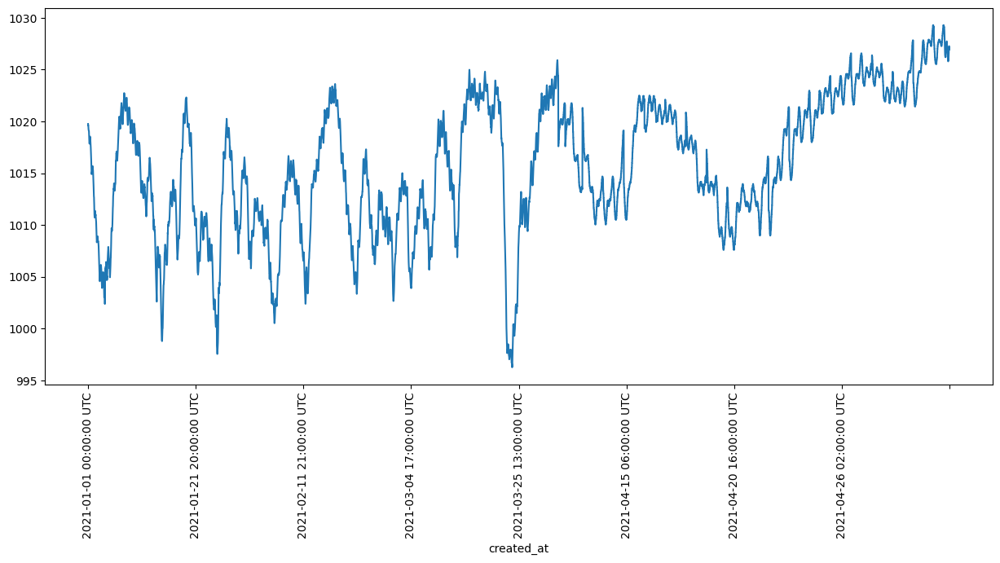

In [35]:
a = milson_df.set_index('created_at')
a.index
y = a['Pressure_hpa']
y.plot(figsize = (15, 6))
plt.xticks(rotation=90)
plt.show()


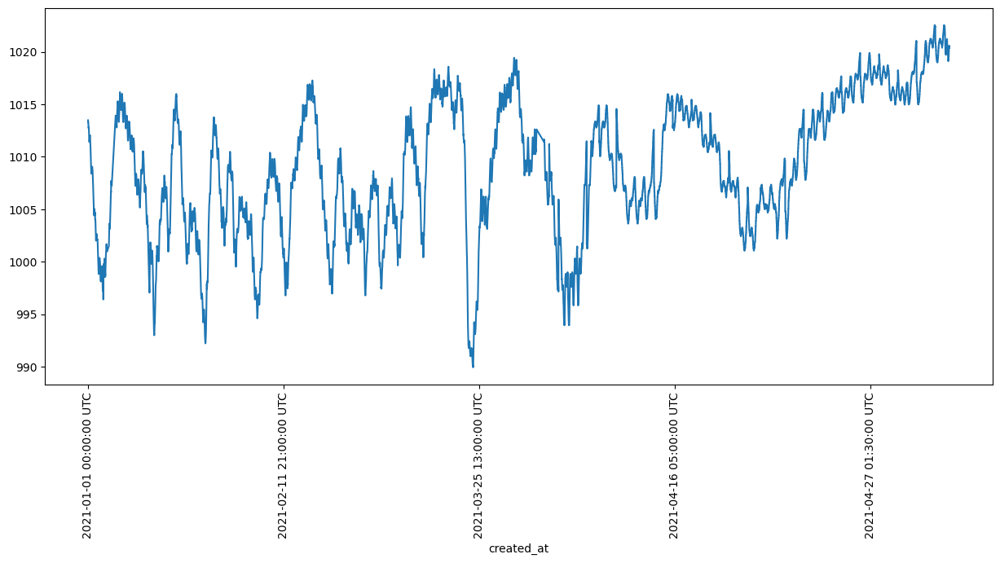

In [36]:
a = mosman_df.set_index('created_at')
a.index
y = a['Pressure_hpa']
y.plot(figsize = (15, 6))
plt.xticks(rotation=90)
plt.show()

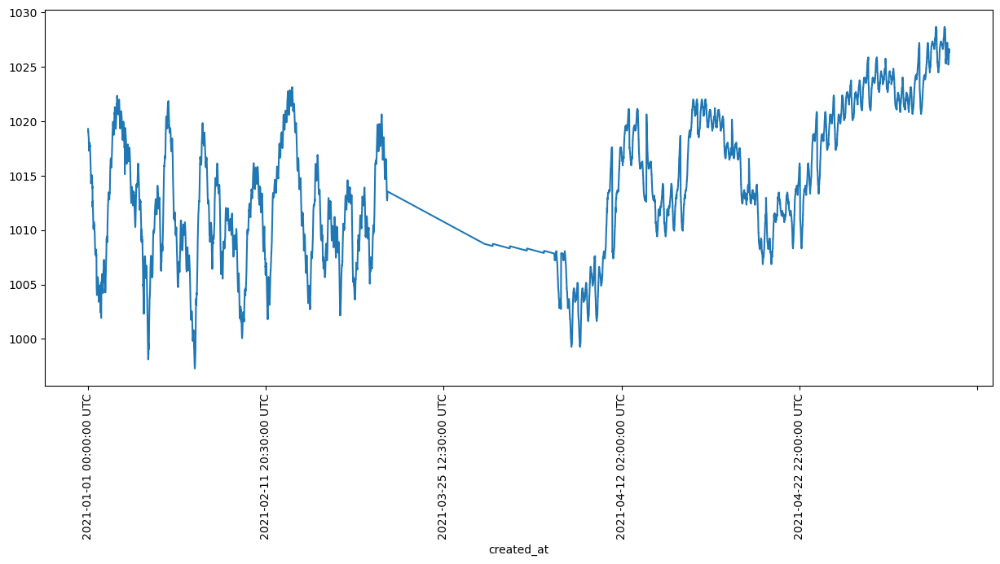

In [37]:
a = balmain_df.set_index('created_at')
a.index
y = a['Pressure_hpa']
y.plot(figsize = (15, 6))
plt.xticks(rotation=90)
plt.show()

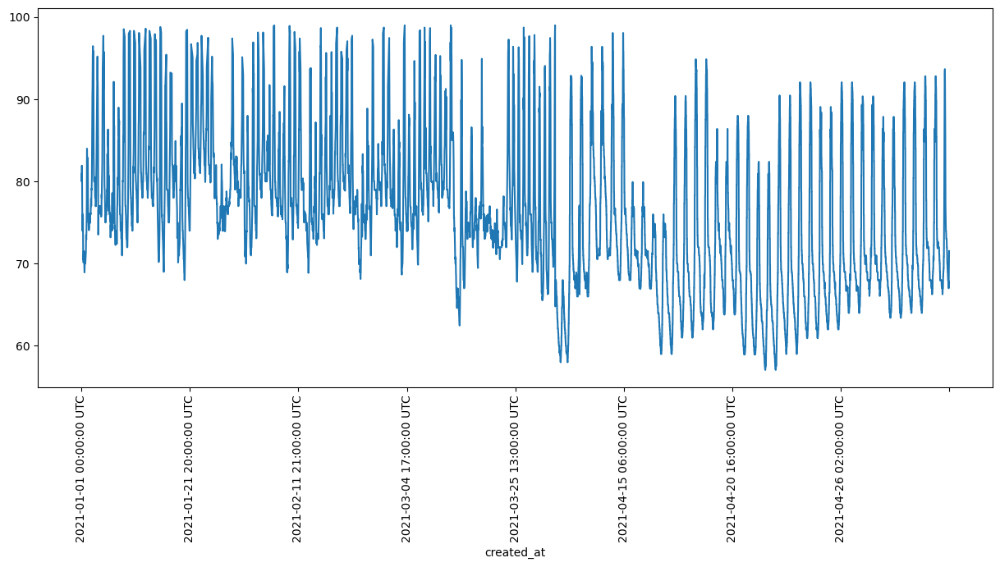

In [38]:
f = milson_outside_df.set_index('created_at')
f.index

y = f['Temperature_F']
y

y.plot(figsize = (15, 6))
plt.xticks(rotation=90)
plt.show()

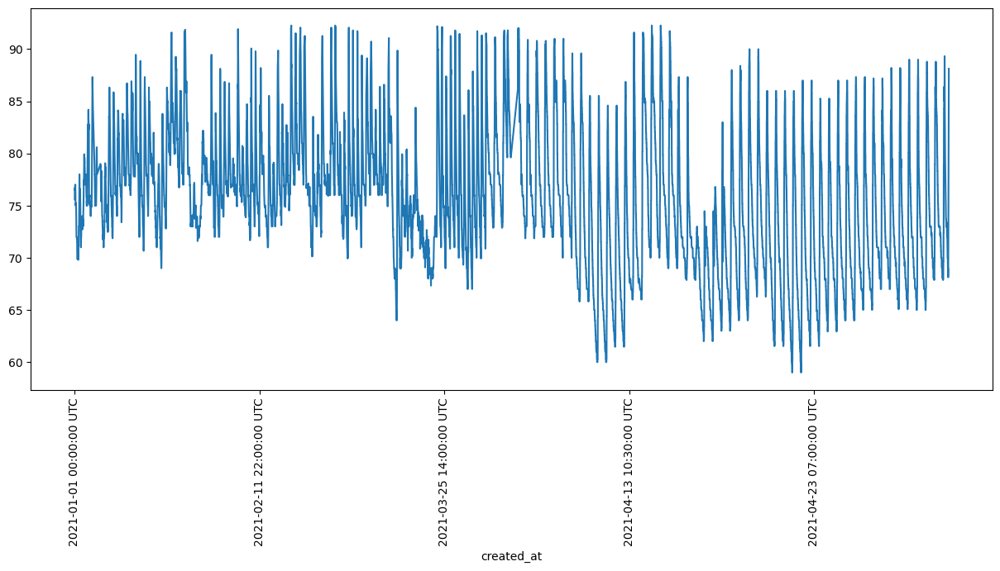

In [39]:
f = mosman_outside_df.set_index('created_at')
f.index

y = f['Temperature_F']
y

y.plot(figsize = (15, 6))
plt.xticks(rotation=90)
plt.show()

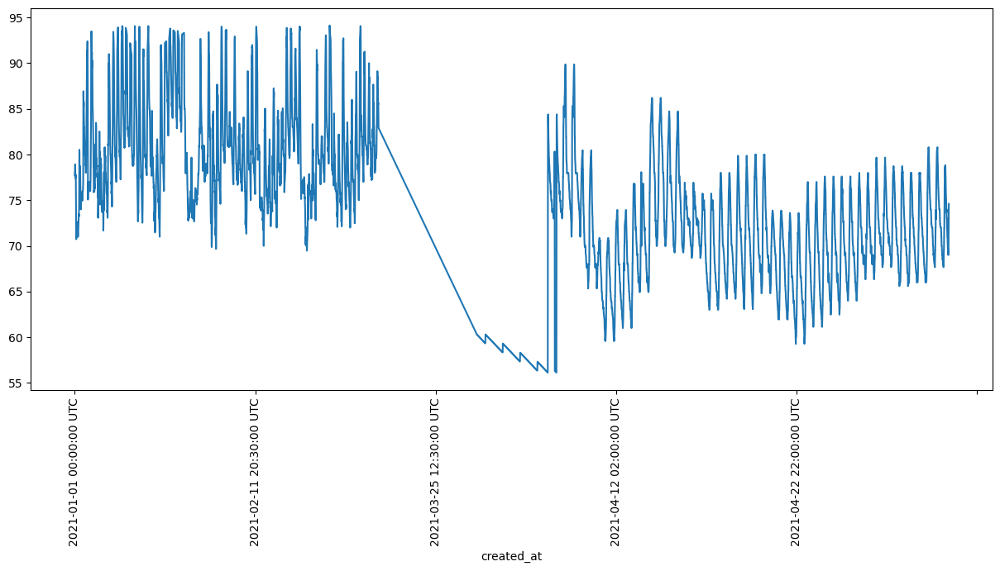

In [40]:
f = balmain_outside_df.set_index('created_at')
f.index

y = f['Temperature_F']
y

y.plot(figsize = (15, 6))
plt.xticks(rotation=90)
plt.show()

In [41]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
import seaborn as sns


import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
import matplotlib
from matplotlib import rcParams

plt.style.use('fivethirtyeight')
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

In [43]:
import pandas as pd
import numpy as np

# Load CSV and preprocess
Balmain_df = pd.read_csv('Balmain_final.csv')

# Drop unnecessary column safely
if 'created_at.1' in Balmain_df.columns:
    Balmain_df = Balmain_df.drop(['created_at.1'], axis=1)

# Convert 'created_at' to datetime
Balmain_df['created_at'] = pd.to_datetime(Balmain_df['created_at'])

# Define numeric columns for processing
num_columns = [col for col in Balmain_df.columns if col not in ['UptimeMinutes', 'created_at']]

# Remove outliers using IQR method
for col in num_columns:
    q1, q3 = Balmain_df[col].quantile([0.25, 0.75])
    iqr = q3 - q1
    lower = q1 - (1.5 * iqr)
    upper = q3 + (1.5 * iqr)
    
    # Mask outliers with NaN using .loc to avoid chained assignment warning
    Balmain_df.loc[(Balmain_df[col] > upper) | (Balmain_df[col] < lower), col] = np.nan

# Set datetime index
Balmain_df = Balmain_df.set_index('created_at')

# Interpolate missing values using time-based method
for col in num_columns:
    Balmain_df[col] = Balmain_df[col].interpolate(method='time')

# Reset index if necessary (optional)
# Balmain_df = Balmain_df.reset_index()

# Display first rows to check
Balmain_df.head()


,PM1.0_CF1_ug/m3,PM2.5_CF1_ug/m3,PM10.0_CF1_ug/m3,UptimeMinutes,RSSI_dbm,Temperature_F,Humidity_%,PM2.5_ATM_ug/m3,>=0.3um/dl,>=0.5um/dl,>1.0um/dl,>=2.5um/dl,>=5.0um/dl,>=10.0um/dl,PM1.0_ATM_ug/m3,PM10_ATM_ug/m3
created_at,,,,,,,,,,,,,,,,
2018-11-10 06:00:00+00:00,0.39,0.70,1.04,20.00,-57.480000,75.43,40.78,0.70,260.20,65.92,8.17,1.51,0.69,0.32,0.69,0.32
2018-11-11 00:00:00+00:00,3.59,4.74,5.41,8.11,-41.003333,80.00,44.00,4.74,908.09,231.47,22.58,2.89,1.00,0.29,3.61,5.41
2018-11-12 00:00:00+00:00,0.09,0.14,0.26,227.00,-50.580000,85.98,37.60,0.14,184.29,38.49,3.50,0.67,0.38,0.32,0.09,0.26
2018-11-13 00:00:00+00:00,2.48,2.64,2.98,279.00,-50.360000,86.18,33.33,2.64,1019.94,198.00,5.11,1.24,0.64,0.34,2.48,2.98
2018-11-14 00:00:00+00:00,2.02,3.28,4.39,614.89,-49.980000,76.89,63.11,3.28,550.78,158.95,22.40,4.26,1.64,0.51,2.01,4.36


In [44]:
Balmain_df= Balmain_df.resample('1D').mean()
for column in num_columns:
    Balmain_df[column]=Balmain_df[column].fillna(Balmain_df[column].median())

Balmain_df.head()

,PM1.0_CF1_ug/m3,PM2.5_CF1_ug/m3,PM10.0_CF1_ug/m3,UptimeMinutes,RSSI_dbm,Temperature_F,Humidity_%,PM2.5_ATM_ug/m3,>=0.3um/dl,>=0.5um/dl,>1.0um/dl,>=2.5um/dl,>=5.0um/dl,>=10.0um/dl,PM1.0_ATM_ug/m3,PM10_ATM_ug/m3
created_at,,,,,,,,,,,,,,,,
2018-11-10 00:00:00+00:00,0.39,0.70,1.04,20.00,-57.480000,75.43,40.78,0.70,260.20,65.92,8.17,1.51,0.69,0.32,0.69,0.32
2018-11-11 00:00:00+00:00,3.59,4.74,5.41,8.11,-41.003333,80.00,44.00,4.74,908.09,231.47,22.58,2.89,1.00,0.29,3.61,5.41
2018-11-12 00:00:00+00:00,0.09,0.14,0.26,227.00,-50.580000,85.98,37.60,0.14,184.29,38.49,3.50,0.67,0.38,0.32,0.09,0.26
2018-11-13 00:00:00+00:00,2.48,2.64,2.98,279.00,-50.360000,86.18,33.33,2.64,1019.94,198.00,5.11,1.24,0.64,0.34,2.48,2.98
2018-11-14 00:00:00+00:00,2.02,3.28,4.39,614.89,-49.980000,76.89,63.11,3.28,550.78,158.95,22.40,4.26,1.64,0.51,2.01,4.36


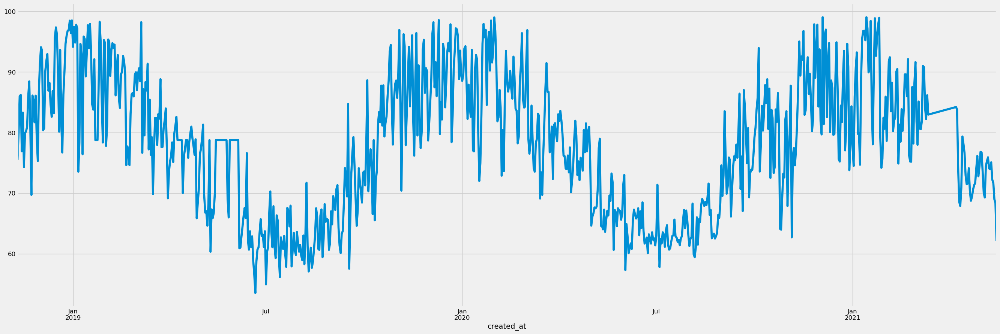

In [45]:
import matplotlib.pyplot as plt

y = Balmain_df['Temperature_F']
y

y.plot(figsize = (30, 10))
plt.show()

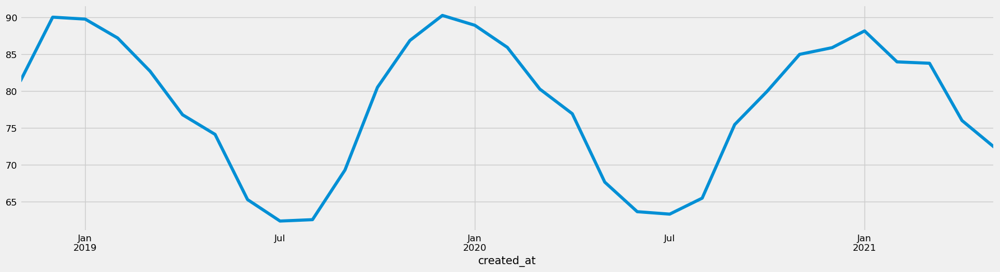

In [46]:
y = Balmain_df['Temperature_F'].resample('MS').mean()

x = Balmain_df.index
y.plot(figsize = (20, 5))
plt.show()

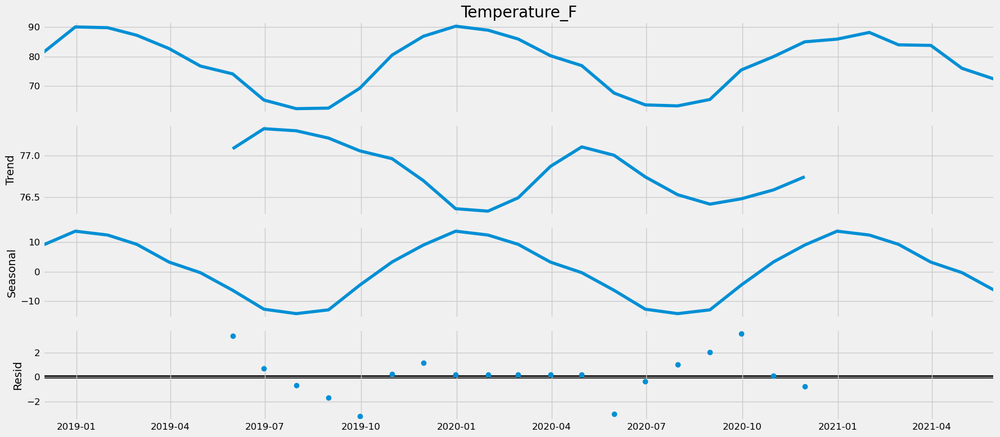

In [49]:
Balmain_month = Balmain_df.resample('ME').mean()
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 18, 8


decomposition = sm.tsa.seasonal_decompose(Balmain_month['Temperature_F'],model = 'additive')
fig = decomposition.plot()
plt.show()

In [50]:
y=Balmain_month['Temperature_F']
p = d = q = range(0, 2)

#take all possible combination for p, d and q
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
for i in range(len(pdq)):
  print('SARIMAX: {} x {}'.format(pdq[i], seasonal_pdq[i]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 0) x (0, 0, 0, 12)
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 1, 0) x (0, 1, 0, 12)
SARIMAX: (0, 1, 1) x (0, 1, 1, 12)
SARIMAX: (1, 0, 0) x (1, 0, 0, 12)
SARIMAX: (1, 0, 1) x (1, 0, 1, 12)
SARIMAX: (1, 1, 0) x (1, 1, 0, 12)
SARIMAX: (1, 1, 1) x (1, 1, 1, 12)


In [54]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y, order = param, seasonal_order = param_seasonal, enforce_stationary = False,enforce_invertibility=False) 
            result = mod.fit()   
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, result.aic))
        except:
            continue

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.78429D+00    |proj g|=  1.77636D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.776D-09   5.784D+00
  F =   5.7842856011965500     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:360.6257072741861
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variable

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.15947D+01    |proj g|=  4.80596D+01

At iterate    5    f=  4.81178D+00    |proj g|=  6.83149D-01

At iterate   10    f=  4.28134D+00    |proj g|=  6.41796D-02

At iterate   15    f=  3.93561D+00    |proj g|=  3.50432D-01

At iterate   20    f=  3.84589D+00    |proj g|=  1.27593D-01


 This problem is unconstrained.



At iterate   25    f=  3.77627D+00    |proj g|=  1.88960D-01

At iterate   30    f=  3.76515D+00    |proj g|=  6.64615D-03

At iterate   35    f=  3.76509D+00    |proj g|=  3.42680D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     37     92      2     0     0   7.487D-03   3.765D+00
  F =   3.7650875759364988     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:239.4354297080629
RUNNING THE L-BFGS-B CODE

           * * *

ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:97.98446931647155
Machine precision = 2.220D-16
 N =            2     M =           10

At X0       


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
 T


At iterate    5    f=  1.51592D+00    |proj g|=  3.47296D-03
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:99.98426164705228

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     11      1     0     0   7.497D-06   1.516D+00
  F =   1.5158751878556820     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.69807D+00    |proj g|=  6.12982D-01

At iterate    5    f=  5.43752D+00    |proj g|=  1.13791D-02

At iterate   1

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s

At iterate    5    f=  1.51815D+00    |proj g|=  1.06596D-02

At iterate   10    f=  1.51735D+00    |proj g|=  2.78515D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     10     12      1     0     0   2.785D-06   1.517D+00
  F =   1.5173512746215949     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:100.07577902653888
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.79038D+00    |proj g|=  6.97403D-01

At iterate    

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.



At iterate   25    f=  3.93597D+00    |proj g|=  8.25940D-02

At iterate   30    f=  3.75832D+00    |proj g|=  1.84866D-01

At iterate   35    f=  3.70868D+00    |proj g|=  2.04874D-02

At iterate   40    f=  3.70578D+00    |proj g|=  5.59146D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     41     81      1     0     0   5.721D-05   3.706D+00
  F =   3.7057772017671389     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:235.75818650956262
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.



At iterate   20    f=  3.91410D+00    |proj g|=  3.09191D-01

At iterate   25    f=  3.75302D+00    |proj g|=  2.71055D-01

At iterate   30    f=  3.68213D+00    |proj g|=  1.01646D-01

At iterate   35    f=  3.67057D+00    |proj g|=  7.79493D-03

At iterate   40    f=  3.66757D+00    |proj g|=  3.90868D-02

At iterate   45    f=  3.66156D+00    |proj g|=  5.32591D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     45     86      1     0     0   5.326D-02   3.662D+00
  F =   3.6615596348936941     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:235.0166973634


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting p

 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.54881D+00    |proj g|=  7.29379D-02

At iterate    5    f=  1.51224D+00    |proj g|=  1.19131D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     10      1     0     0   3.348D-07   1.512D+00
  F =   1.5121088857411973     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:99.75075091595423
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.



At iterate   20    f=  2.76388D+00    |proj g|=  1.42924D-02

At iterate   25    f=  2.76381D+00    |proj g|=  1.15407D-03

At iterate   30    f=  2.76381D+00    |proj g|=  3.77328D-05
ARIMA(0, 1, 0)x(1, 0, 1, 12)12 - AIC:177.35613477768896

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     30     37      1     0     0   3.773D-05   2.764D+00
  F =   2.7638086254465963     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate   

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.61468D+00    |proj g|=  1.00578D-01

At iterate    5    f=  1.58749D+00    |proj g|=  9.58659D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      7      9      1     0     0   3.242D-06   1.587D+00
  F =   1.5874852365773791     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(1, 1, 1, 12)12 - AIC:104.4240846677975
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate   15    f=  2.75852D+00    |proj g|=  1.80613D-02

At iterate   20    f=  2.75823D+00    |proj g|=  2.22284D-03

At iterate   25    f=  2.75822D+00    |proj g|=  7.06569D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     27     30      1     0     0   1.109D-05   2.758D+00
  F =   2.7582157672469614     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(0, 1, 1)x(1, 0, 1, 12)12 - AIC:179.0093775693116


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.58221D+00    |proj g|=  7.65717D-02

At iterate    5    f=  1.50545D+00    |proj g|=  1.86929D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     15      1     0     0   3.349D-06   1.505D+00
  F =   1.5054437172033004     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(1, 1, 0, 12)12 - AIC:99.33751046660463
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate    5    f=  2.96011D+00    |proj g|=  1.98258D-02

At iterate   10    f=  2.95097D+00    |proj g|=  3.60125D-02

At iterate   15    f=  2.92358D+00    |proj g|=  2.42189D-01

At iterate   20    f=  2.91524D+00    |proj g|=  3.76270D-03

At iterate   25    f=  2.91388D+00    |proj g|=  3.42532D-03

At iterate   30    f=  2.91276D+00    |proj g|=  2.16396D-02

At iterate   35    f=  2.91218D+00    |proj g|=  9.15396D-02

At iterate   40    f=  2.91192D+00    |proj g|=  1.18812D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     43     69      1     0     0   3.208D-02   2.912D+00
  F =   2.91175084904


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting p

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.11331D+00    |proj g|=  5.25407D-01

At iterate    5    f=  2.99610D+00    |proj g|=  2.70794D-02

At iterate   10    f=  2.98576D+00    |proj g|=  1.67228D-02

At iterate   15    f=  2.98350D+00    |proj g|=  2.60522D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     17     19      1     0     0   5.874D-06   2.983D+00
  F =   2.9834961222827836     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1,

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.33277D+00    |proj g|=  1.35023D+00

At iterate    5    f=  3.70668D+00    |proj g|=  4.75712D-02
  ys=-2.462E-01  -gs= 1.656E-02 BFGS update SKIPPED

At iterate   10    f=  3.60439D+00    |proj g|=  1.51030D-02

At iterate   15    f=  3.57775D+00    |proj g|=  3.07940D-01

At iterate   20    f=  3.14492D+00    |proj g|=  4.05487D-02

At iterate   25    f=  3.05582D+00    |proj g|=  1.11556D-01

At iterate   30    f=  2.99810D+00    |proj g|=  4.44327D-02

At iterate   35    f=  2.97457D+00    |proj g|=  4.04288D-02

At iterate   40    f=  2.96372D+00    |proj g|=  9.01925D-02

At iterate   45    f=  2.95903D+00    |proj g|=  6.02325D-02

At iterate   50    f=  2.95844D+00    |proj g|=  9.90010D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.



At iterate   20    f=  2.91362D+00    |proj g|=  2.02762D-02

At iterate   25    f=  2.91304D+00    |proj g|=  6.54812D-03

At iterate   30    f=  2.91163D+00    |proj g|=  6.08045D-02

At iterate   35    f=  2.91039D+00    |proj g|=  5.93963D-02

At iterate   40    f=  2.90976D+00    |proj g|=  7.96842D-02

At iterate   45    f=  2.90945D+00    |proj g|=  7.46545D-02

At iterate   50    f=  2.90927D+00    |proj g|=  1.01000D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   1.010D-01   2.909D+00
  F =   2.9092735795657267     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seaso

ARIMA(1, 0, 1)x(1, 0, 1, 12)12 - AIC:190.37496193307507
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.55736D+00    |proj g|=  1.27809D-01

At iterate    5    f=  1.51484D+00    |proj g|=  6.08897D-03

At iterate   10    f=  1.51115D+00    |proj g|=  3.46682D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     13     15      1     0     0   1.922D-05   1.511D+00
  F =   1.5111420946420124     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(1, 0, 1)

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate   10    f=  2.74522D+00    |proj g|=  1.67450D-02

At iterate   15    f=  2.74412D+00    |proj g|=  9.59938D-03

At iterate   20    f=  2.74395D+00    |proj g|=  4.46995D-03

At iterate   25    f=  2.74389D+00    |proj g|=  2.50177D-03

At iterate   30    f=  2.74388D+00    |proj g|=  1.41585D-03

At iterate   35    f=  2.74388D+00    |proj g|=  1.27953D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     35     48      1     0     0   1.280D-04   2.744D+00
  F =   2.7438799639909801     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(1, 1, 0)x(1, 0, 1, 12)12 - AIC:178.1205577674

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.



At iterate    5    f=  1.53957D+00    |proj g|=  4.23839D-03

At iterate   10    f=  1.53954D+00    |proj g|=  8.51724D-05

At iterate   15    f=  1.53953D+00    |proj g|=  7.68601D-04

At iterate   20    f=  1.53952D+00    |proj g|=  2.13690D-04

At iterate   25    f=  1.53951D+00    |proj g|=  7.09177D-04

At iterate   30    f=  1.53951D+00    |proj g|=  6.08317D-04

At iterate   35    f=  1.53950D+00    |proj g|=  5.86129D-04

At iterate   40    f=  1.53950D+00    |proj g|=  6.16325D-04

At iterate   45    f=  1.53950D+00    |proj g|=  8.16220D-04

At iterate   50    f=  1.53949D+00    |proj g|=  5.71396D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except 


At iterate    5    f=  1.54031D+00    |proj g|=  2.01538D-03

At iterate   10    f=  1.54017D+00    |proj g|=  2.87837D-03

At iterate   15    f=  1.53591D+00    |proj g|=  6.75279D-02

At iterate   20    f=  1.53115D+00    |proj g|=  5.12310D-03

At iterate   25    f=  1.53042D+00    |proj g|=  1.98983D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     29     39      1     0     0   1.702D-05   1.530D+00
  F =   1.5303827005912947     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(1, 1, 1)x(0, 1, 1, 12)12 - AIC:102.88372743666027
RUNNING THE L-BFGS-B CODE

           * * *

Machine prec

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.



At iterate   10    f=  2.74572D+00    |proj g|=  1.53927D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     12     14      1     0     0   1.867D-06   2.746D+00
  F =   2.7457193646191462     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 1)x(1, 0, 0, 12)12 - AIC:178.23460060638706
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.78689D+00    |proj g|=  1.56361D-01

At iterate    5    f=  2.74893D+00    |proj g|=  2.77801D-02

At iterate   


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting p

ARIMA(1, 1, 1)x(1, 0, 1, 12)12 - AIC:179.6935561582761
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.56017D+00    |proj g|=  4.71629D-02

At iterate    5    f=  1.54006D+00    |proj g|=  8.08832D-03

At iterate   10    f=  1.53704D+00    |proj g|=  5.74409D-02

At iterate   15    f=  1.52846D+00    |proj g|=  5.73872D-03

At iterate   20    f=  1.52841D+00    |proj g|=  1.40378D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     21     25      1     0     0   5.123D-

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [55]:
model = sm.tsa.statespace.SARIMAX(y, order = (0, 1, 0),
                                  seasonal_order = (0, 1, 0, 12)
                                 )
result = model.fit()
print(result.summary().tables[1])

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.66610D+00    |proj g|=  1.41084D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      4      5      1     0     0   2.819D-06   1.614D+00
  F =   1.6142433267961522     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2        15.2155      7.514    

 This problem is unconstrained.


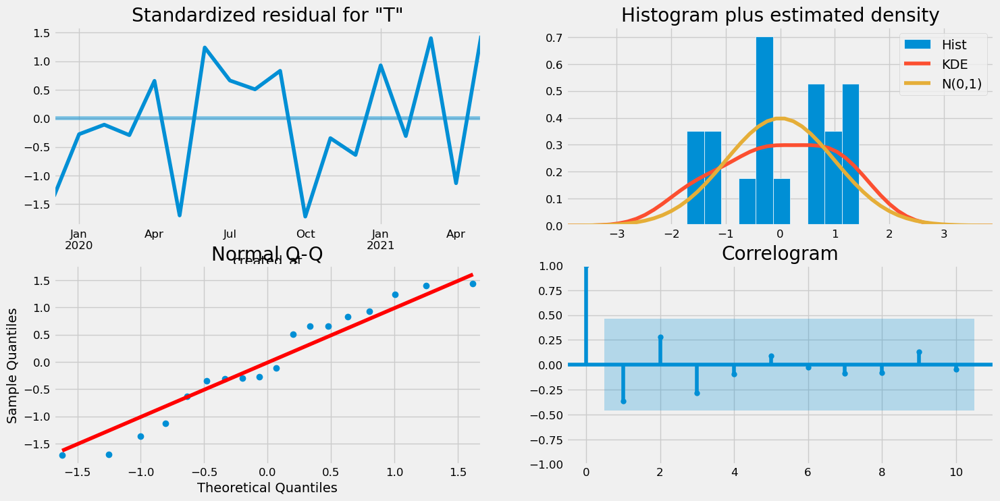

In [56]:
result.plot_diagnostics(figsize = (16, 8))
plt.show()

In [57]:
prediction = result.get_prediction(start = pd.to_datetime('2021-01-31 00:00:00+00:00'), dynamic = False)
prediction_ci = prediction.conf_int()
prediction_ci

,lower Temperature_F,upper Temperature_F
created_at,,
2021-01-31 00:00:00+00:00,76.926132,92.216592
2021-02-28 00:00:00+00:00,77.545231,92.835690
2021-03-31 00:00:00+00:00,70.688692,85.979151
2021-04-30 00:00:00+00:00,72.809018,88.099477
2021-05-31 00:00:00+00:00,59.118562,74.409021


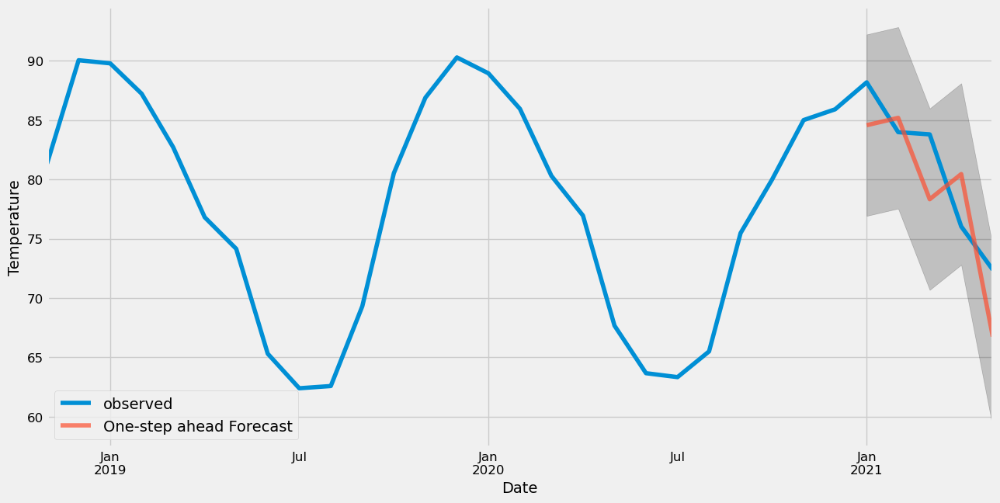

In [58]:
ax = y['2018':].plot(label = 'observed')
prediction.predicted_mean.plot(ax = ax, label = 'One-step ahead Forecast', alpha = 0.7, figsize = (14, 7))
ax.fill_between(prediction_ci.index, prediction_ci.iloc[:, 0], prediction_ci.iloc[:, 1], color = 'k', alpha = 0.2)
ax.set_xlabel("Date")
ax.set_ylabel('Temperature')
plt.legend()
plt.show()

In [59]:
y_hat = prediction.predicted_mean
y_truth = y['2021-01-31 00:00:00+00:00':]

mse = ((y_hat - y_truth) ** 2).mean()
rmse = np.sqrt(mse)
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 2)))

The Mean Squared Error of our forecasts is 19.11
The Root Mean Squared Error of our forecasts is 4.37


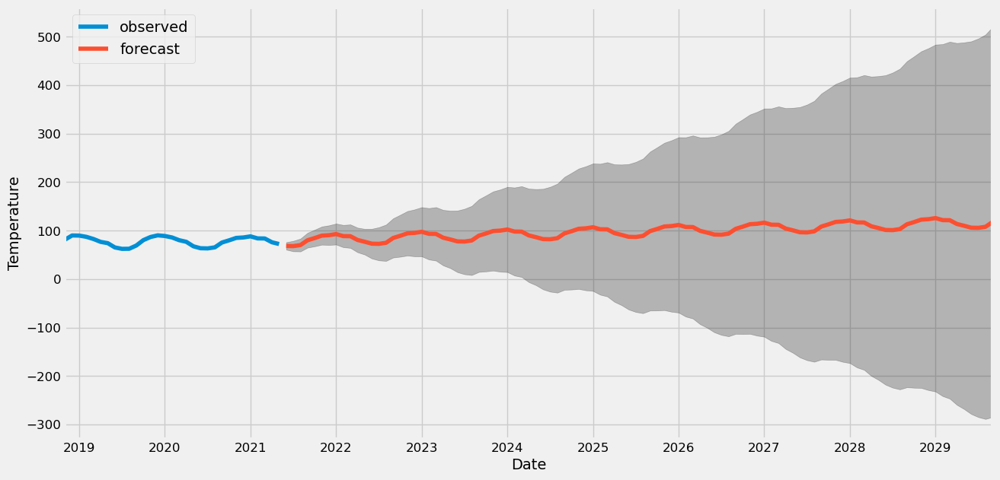

In [60]:
pred_uc = result.get_forecast(steps = 100)
pred_ci = pred_uc.conf_int()

ax = y.plot(label = 'observed', figsize = (14, 7))
pred_uc.predicted_mean.plot(ax = ax, label = 'forecast')
ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color = 'k', alpha = 0.25)
ax.set_xlabel('Date')
ax.set_ylabel('Temperature')

plt.legend()
plt.show()

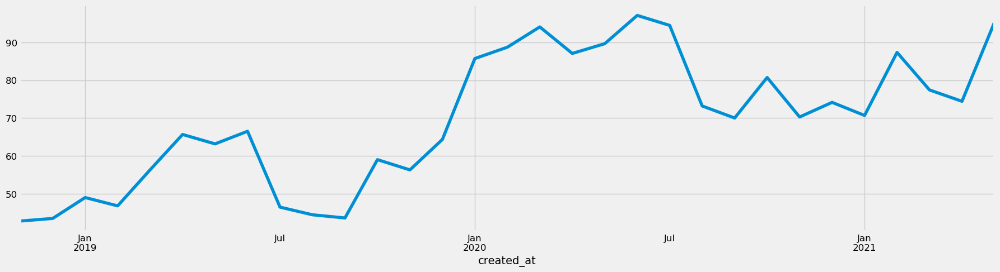

In [61]:
y = Balmain_df['Humidity_%'].resample('MS').mean()

x = Balmain_df.index
y.plot(figsize = (20, 5))
plt.show()

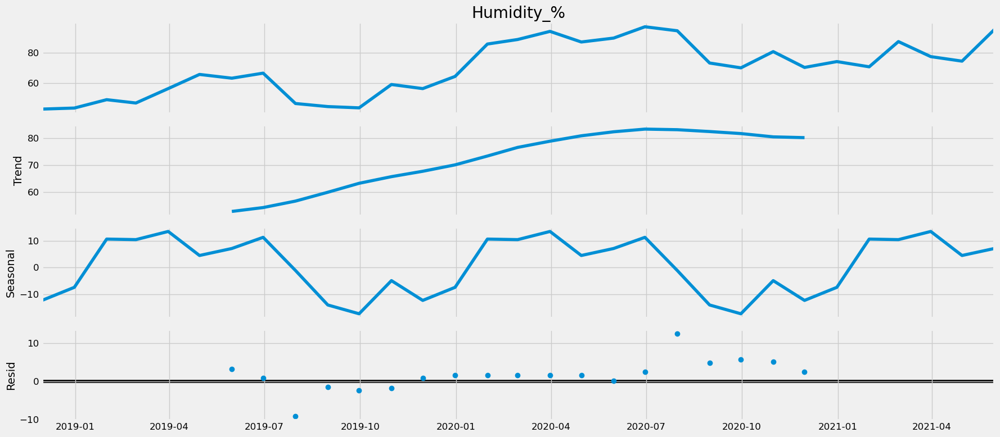

In [62]:
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(Balmain_month['Humidity_%'],model = 'additive')
fig = decomposition.plot()
plt.show()

In [63]:
y=Balmain_month['Humidity_%']
p = d = q = range(0, 2)

#take all possible combination for p, d and q
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
for i in range(len(pdq)):
  print('SARIMAX: {} x {}'.format(pdq[i], seasonal_pdq[i]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 0) x (0, 0, 0, 12)
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 1, 0) x (0, 1, 0, 12)
SARIMAX: (0, 1, 1) x (0, 1, 1, 12)
SARIMAX: (1, 0, 0) x (1, 0, 0, 12)
SARIMAX: (1, 0, 1) x (1, 0, 1, 12)
SARIMAX: (1, 1, 0) x (1, 1, 0, 12)
SARIMAX: (1, 1, 1) x (1, 1, 1, 12)


In [64]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y, order = param, seasonal_order = param_seasonal, enforce_stationary = False,enforce_invertibility=False) 
            result = mod.fit()   
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, result.aic))
        except:
            continue

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.69211D+00    |proj g|=  1.68754D-09

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   1.688D-09   5.692D+00
  F =   5.6921110715004435     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:354.9108864330275
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variable

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12


At iterate   20    f=  5.03099D+00    |proj g|=  1.06045D-03

At iterate   25    f=  5.03099D+00    |proj g|=  2.62368D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     27      1     0     0   2.624D-07   5.031D+00
  F =   5.0309854250350057     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:317.92109635217037
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.66247D+00    |proj g|=  3.99465D-01

At iterate   

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate    5    f=  5.37108D+00    |proj g|=  1.16132D-02

At iterate   10    f=  5.26888D+00    |proj g|=  4.01702D-01

At iterate   15    f=  4.79432D+00    |proj g|=  4.48953D-02

At iterate   20    f=  4.79320D+00    |proj g|=  6.40457D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     20     26      1     0     0   6.405D-06   4.793D+00
  F =   4.7931981009199225     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:303.1782822570352
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_s


ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:291.31501068371676
At iterate   50    f=  4.56960D+00    |proj g|=  3.18430D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     50     79      1     1     0   3.184D-02   4.570D+00
  F =   4.5695969465115605     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.68509D+00    |proj g|=  5.73738D-02

At iterate    5    f=  2.67716D+00    |proj g|=  3.16399D-02

At iterate   

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:226.11853332626714

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.61508D+00    |proj g|=  3.23413D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      2      4      1     0     0   1.299D-06   3.615D+00
  F =   3.6148150536494699     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variabl

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.29132D+00    |proj g|=  5.71043D-02

At iterate    5    f=  2.28422D+00    |proj g|=  7.80847D-04
ARIMA(0, 1, 0)x(1, 1, 1, 12)12 - AIC:147.62156591283446
ARIMA(0, 1, 1)x(0, 0, 0, 12)12 - AIC:227.93890842213938

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     10      1     0     0   6.299D-06   2.284D+00
  F =   2.2842188050457168     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate   15    f=  3.58183D+00    |proj g|=  3.64535D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     18     21      1     0     0   4.509D-06   3.582D+00
  F =   3.5818283978344048     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 1)x(1, 0, 1, 12)12 - AIC:230.0733606657331
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.28126D+00    |proj g|=  3.87490D-02

At iterate    5    f=  2.27570D+00    |proj g|=  1.77879D-02

At iterate   1

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWa


At iterate    5    f=  3.96714D+00    |proj g|=  3.39185D-01

At iterate   10    f=  3.78687D+00    |proj g|=  3.68600D-02

At iterate   15    f=  3.77760D+00    |proj g|=  1.39906D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     19     20      1     0     0   4.251D-06   3.778D+00
  F =   3.7775419145447375     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(1, 0, 0, 12)12 - AIC:240.20759870177372
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate   

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword argume


At iterate    5    f=  4.02552D+00    |proj g|=  3.06530D-01

At iterate   10    f=  3.78004D+00    |proj g|=  2.70784D-02

At iterate   15    f=  3.76693D+00    |proj g|=  1.57971D-03

At iterate   20    f=  3.76678D+00    |proj g|=  4.20755D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     22     23      1     0     0   4.006D-06   3.767D+00
  F =   3.7667787302810067     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(0, 0, 1, 12)12 - AIC:241.54028127742242
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown


At iterate   10    f=  3.78546D+00    |proj g|=  3.96927D-02

At iterate   15    f=  3.77142D+00    |proj g|=  8.62460D-04

At iterate   20    f=  3.77138D+00    |proj g|=  1.62908D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     22     23      1     0     0   7.295D-07   3.771D+00
  F =   3.7713808147163892     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(1, 0, 0, 12)12 - AIC:241.82561051241612
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate   

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.



At iterate   25    f=  2.39691D+00    |proj g|=  1.35728D-03

At iterate   30    f=  2.39686D+00    |proj g|=  1.68550D-03

At iterate   35    f=  2.39684D+00    |proj g|=  2.73381D-03

At iterate   40    f=  2.39682D+00    |proj g|=  8.12995D-04

At iterate   45    f=  2.39681D+00    |proj g|=  4.51878D-04

At iterate   50    f=  2.39680D+00    |proj g|=  2.37111D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     67      1     0     0   2.371D-03   2.397D+00
  F =   2.3968004667146077     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
ARIMA(1, 0, 1)x(1, 1, 1, 12)12 - AIC:158.6016289363

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seaso


At iterate    5    f=  3.58939D+00    |proj g|=  2.05885D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     11      1     0     0   1.059D-06   3.588D+00
  F =   3.5877875641720296     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(0, 0, 1, 12)12 - AIC:228.44282897866583
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.28508D+00    |proj g|=  3.30093D-03

At iterate    5    f=  2.28490D+00    |proj g|=  5.00384D-03

           * 

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12


At iterate   15    f=  3.58218D+00    |proj g|=  1.31817D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     19     21      1     0     0   3.682D-06   3.582D+00
  F =   3.5821681695342513     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(1, 0, 1, 12)12 - AIC:230.09442651112357
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.28082D+00    |proj g|=  4.67970D-02

At iterate    5    f=  2.27469D+00    |proj g|=  9.71278D-03

At iterate   

 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstraine


At iterate   15    f=  3.58110D+00    |proj g|=  5.62756D-02

At iterate   20    f=  3.57935D+00    |proj g|=  8.42813D-03

At iterate   25    f=  3.57926D+00    |proj g|=  7.37097D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     29     35      1     0     0   1.860D-06   3.579D+00
  F =   3.5792603605612792     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 1)x(0, 0, 1, 12)12 - AIC:229.9141423547993
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.



At iterate   15    f=  3.57477D+00    |proj g|=  6.81365D-03

At iterate   20    f=  3.57465D+00    |proj g|=  5.20357D-04

At iterate   25    f=  3.57463D+00    |proj g|=  1.39677D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     28     39      1     0     0   8.186D-06   3.575D+00
  F =   3.5746277231620933     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 1)x(1, 0, 1, 12)12 - AIC:231.62691883604978
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate   

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.


At iterate    5    f=  2.27691D+00    |proj g|=  1.08532D-02

At iterate   10    f=  2.27225D+00    |proj g|=  1.90898D-03

At iterate   15    f=  2.27223D+00    |proj g|=  8.22196D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     15     18      1     0     0   8.222D-06   2.272D+00
  F =   2.2722301262562556     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 1)x(1, 1, 1, 12)12 - AIC:150.87826782788784


In [65]:
model = sm.tsa.statespace.SARIMAX(y, order = (0, 1, 0),
                                  seasonal_order = (0, 1, 0, 12)
                                 )
result = model.fit()
print(result.summary().tables[1])

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.34272D+00    |proj g|=  4.39952D-02

At iterate    5    f=  2.29087D+00    |proj g|=  2.40230D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      6      7      1     0     0   2.628D-07   2.291D+00
  F =   2.2908661588514012     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------

 This problem is unconstrained.


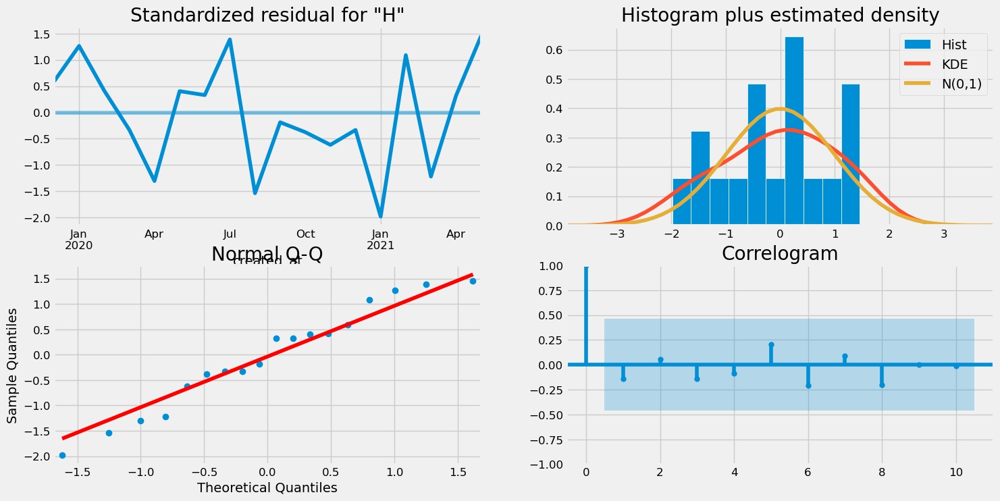

In [66]:
result.plot_diagnostics(figsize = (16, 8))
plt.show()

In [67]:
prediction = result.get_prediction(start = pd.to_datetime('2021-01-31 00:00:00+00:00'), dynamic = False)
prediction_ci = prediction.conf_int()
prediction_ci

,lower Humidity_%,upper Humidity_%
created_at,,
2021-01-31 00:00:00+00:00,70.983043,120.016957
2021-02-28 00:00:00+00:00,49.182042,98.215956
2021-03-31 00:00:00+00:00,68.175922,117.209836
2021-04-30 00:00:00+00:00,45.914467,94.948381
2021-05-31 00:00:00+00:00,52.500147,101.534060


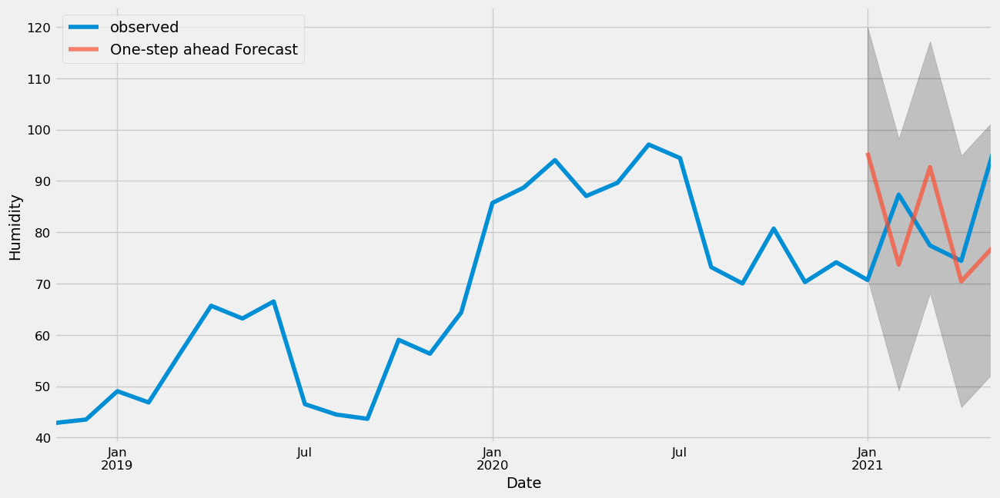

In [68]:
ax = y['2018':].plot(label = 'observed')
prediction.predicted_mean.plot(ax = ax, label = 'One-step ahead Forecast', alpha = 0.7, figsize = (14, 7))
ax.fill_between(prediction_ci.index, prediction_ci.iloc[:, 0], prediction_ci.iloc[:, 1], color = 'k', alpha = 0.2)
ax.set_xlabel("Date")
ax.set_ylabel('Humidity')
plt.legend()
plt.show()

In [69]:
y_hat = prediction.predicted_mean
y_truth = y['2021-01-31 00:00:00+00:00':]

mse = ((y_hat - y_truth) ** 2).mean()
rmse = np.sqrt(mse)
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 2)))

The Mean Squared Error of our forecasts is 276.51
The Root Mean Squared Error of our forecasts is 16.63


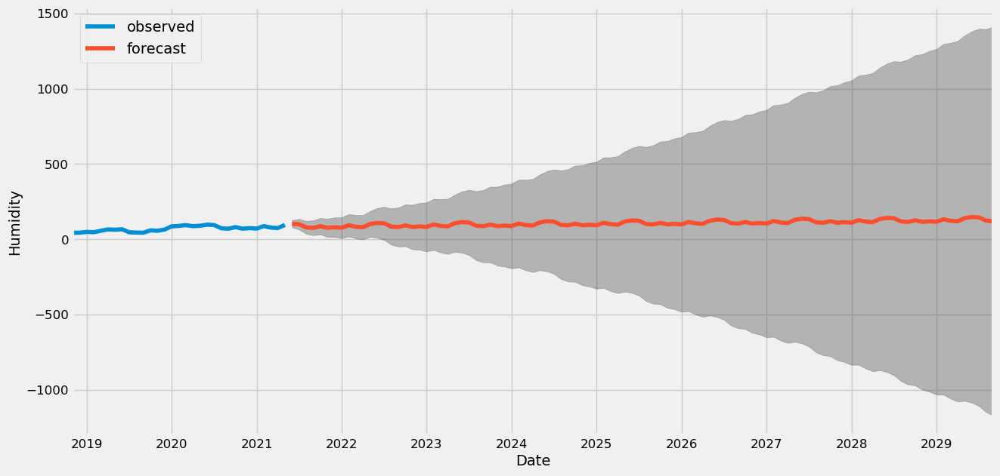

In [70]:
pred_uc = result.get_forecast(steps = 100)
pred_ci = pred_uc.conf_int()

ax = y.plot(label = 'observed', figsize = (14, 7))
pred_uc.predicted_mean.plot(ax = ax, label = 'forecast')
ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color = 'k', alpha = 0.25)
ax.set_xlabel('Date')
ax.set_ylabel('Humidity')

plt.legend()
plt.show()

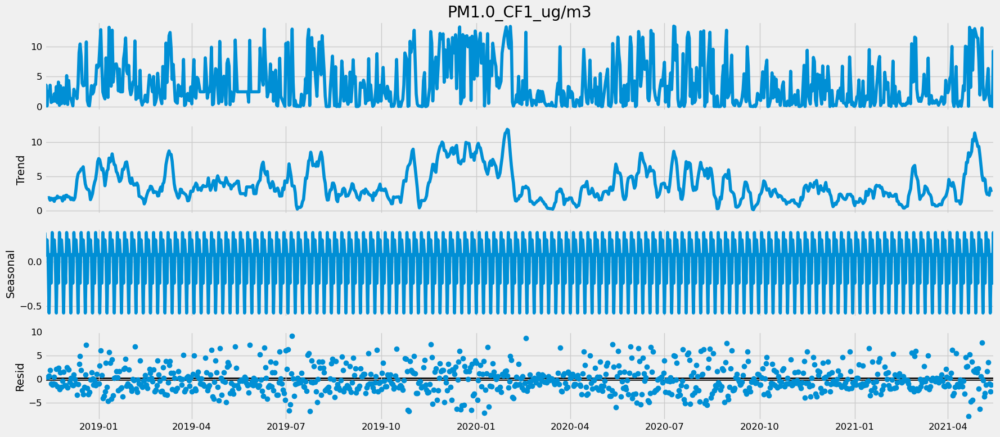

In [71]:
Balmain_df=Balmain_df.rename(columns={'Unnamed: 0':'created_at'})
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 18, 8


decomposition = sm.tsa.seasonal_decompose(Balmain_df['PM1.0_CF1_ug/m3'],model = 'additive')
fig = decomposition.plot()
plt.show()

In [74]:
Balmain_month=Balmain_df.resample('ME').mean()
plt.style.use('fivethirtyeight')
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

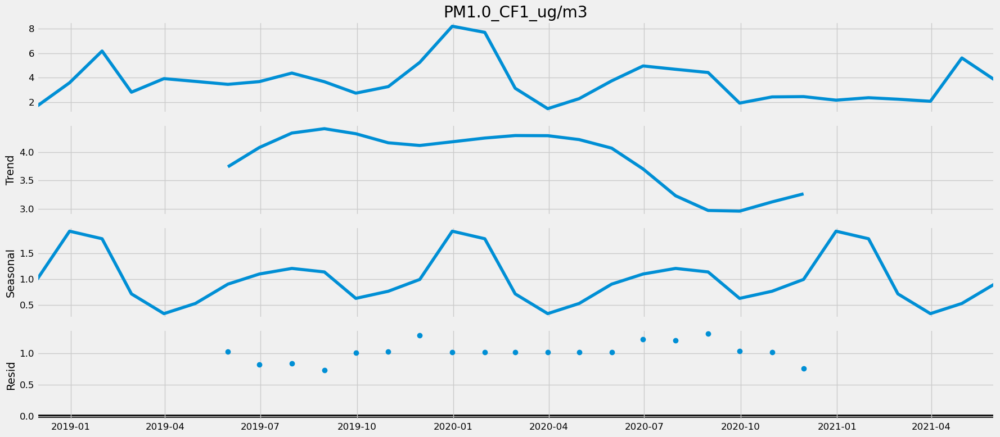

In [75]:
rcParams['figure.figsize'] = 18, 8


decomposition = sm.tsa.seasonal_decompose(Balmain_month['PM1.0_CF1_ug/m3'],model = 'multiplicative')
fig = decomposition.plot()
plt.show()

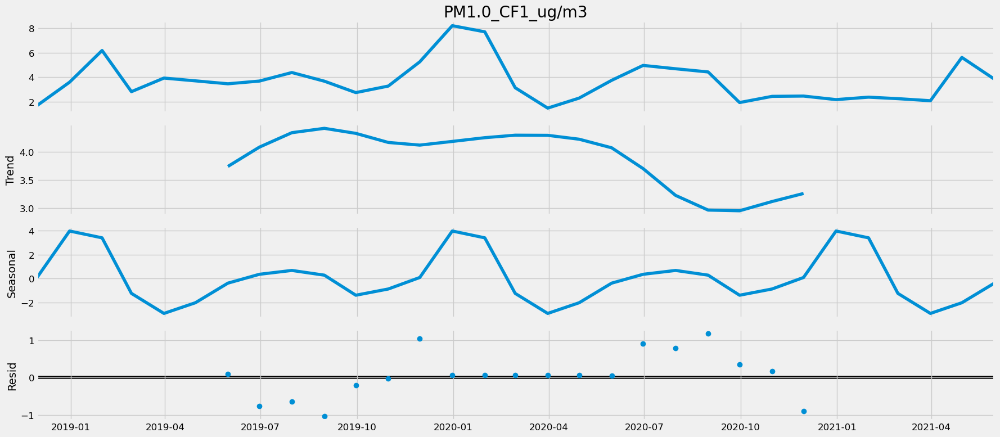

In [76]:
rcParams['figure.figsize'] = 18, 8


decomposition = sm.tsa.seasonal_decompose(Balmain_month['PM1.0_CF1_ug/m3'],model = 'additive')
fig = decomposition.plot()
plt.show()

In [77]:
y=Balmain_month['PM1.0_CF1_ug/m3']
p = d = q = range(0, 2)

#take all possible combination for p, d and q
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
for i in range(len(pdq)):
  print('SARIMAX: {} x {}'.format(pdq[i], seasonal_pdq[i]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 0) x (0, 0, 0, 12)
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 1, 0) x (0, 1, 0, 12)
SARIMAX: (0, 1, 1) x (0, 1, 1, 12)
SARIMAX: (1, 0, 0) x (1, 0, 0, 12)
SARIMAX: (1, 0, 1) x (1, 0, 1, 12)
SARIMAX: (1, 1, 0) x (1, 1, 0, 12)
SARIMAX: (1, 1, 1) x (1, 1, 1, 12)


In [78]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y, order = param, seasonal_order = param_seasonal, enforce_stationary = False,enforce_invertibility=False) 
            result = mod.fit()   
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, result.aic))
        except:
            continue

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10
ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:176.2856558236504

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.81106D+00    |proj g|=  6.17728D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      0      1      0     0     0   6.177D-07   2.811D+00
  F =   2.8110589648975868     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variable

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/


At iterate   50    f=  2.43281D+00    |proj g|=  1.22399D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     50     72      1     0     0   1.224D-02   2.433D+00
  F =   2.4328072835528087     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:156.83405158027415
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.57839D+00    |proj g|=  5.07059D-01

At iterate    5    f=  1.34466D+00    |proj g|=  1.55516D-02

           * 

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate    5    f=  1.26398D+00    |proj g|=  3.42516D-02

At iterate   10    f=  1.26312D+00    |proj g|=  4.90881D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     10     12      1     0     0   4.909D-06   1.263D+00
  F =   1.2631206015356653     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:86.31347729521124
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:119.73425797773034
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.26964D+00    |proj g|=  1.31607D-01

At iterate    5    f=  1.24283D+00    |proj g|=  2.62564D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      6      8      1     0     0   3.403D-06   1.243D+00
  F =   1.2428283397871145     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(0, 1, 0)x(1, 1, 1, 12)12 - AIC:83.0553570668011
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N 

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate    5    f=  1.86272D+00    |proj g|=  3.03716D-03

At iterate   10    f=  1.86199D+00    |proj g|=  3.58107D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     12     15      1     0     0   3.482D-05   1.862D+00
  F =   1.8619886088862172     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
ARIMA(0, 1, 1)x(1, 0, 1, 12)12 - AIC:123.44329375094547
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.32755D+00    |proj g|=  1.49873D-01

At iterate   

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate   10    f=  1.24162D+00    |proj g|=  7.32039D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     11     14      1     0     0   4.884D-06   1.242D+00
  F =   1.2416228334291397     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 0)x(0, 1, 1, 12)12 - AIC:82.98061567260666
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08684D+00    |proj g|=  2.10524D-01

At iterate    5    f=  1.91572D+00    |proj g|=  1.99577D-02

At iterate   1

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWa

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.29402D+00    |proj g|=  1.80081D-01

At iterate    5    f=  1.24114D+00    |proj g|=  2.27244D-03

At iterate   10    f=  1.24113D+00    |proj g|=  1.13590D-04

At iterate   15    f=  1.24112D+00    |proj g|=  1.16387D-03

At iterate   20    f=  1.24112D+00    |proj g|=  4.43655D-04

At iterate   25    f=  1.24111D+00    |proj g|=  6.35632D-04

At iterate   30    f=  1.24110D+00    |proj g|=  5.66465D-04

At iterate   35    f=  1.24109D+00    |proj g|=  3.78588D-04

At iterate   40    f=  1.24109D+00    |proj g|=  6.75984D-04

At iterate   45    f=  1.24109D+00    |proj g|=  2.76372D-04

At iterate   50    f=  1.24108D+00    |proj g|=  2.40280D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seaso


At iterate   10    f=  1.23429D+00    |proj g|=  5.74043D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4     10     12      1     0     0   5.740D-06   1.234D+00
  F =   1.2342913462957394     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 0, 1)x(0, 1, 1, 12)12 - AIC:84.52606347033584
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05459D+00    |proj g|=  2.07076D-01

At iterate    5    f=  1.90283D+00    |proj g|=  1.23665D-02
ARIMA(1, 0, 1)x

 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning: Non-stationary starting seasonal autoregressive Using zeros as starting parameters.
  warn('Non-stationary starting seasonal autoregressive'
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     17     21      1     0     0   6.291D-06   1.901D+00
  F =   1.9005883515825743     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.26951D+00    |proj g|=  1.30764D-01

At iterate    5    f=  1.23432D+00    |proj g|=  6.08467D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      8     10      1     0     0   1.673D-07   1.243D+00
  F =   1.2425948361305015     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
ARIMA(1, 1, 0)x(0, 1, 1, 12)12 - AIC:83.0408798400911
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.86727D+00    |proj g|=  5.61272D-02

At iterate    5    f=  1.86427D+00    |proj g|=  5.98699D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      5      8

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/s


At iterate    5    f=  1.77654D+00    |proj g|=  2.14657D-02
ARIMA(1, 1, 1)x(0, 0, 1, 12)12 - AIC:118.1394620054257

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      9     11      1     0     0   5.808D-07   1.776D+00
  F =   1.7764429355713822     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.29288D+00    |proj g|=  2.17827D-01

ARIMA(1, 1, 1)x(0, 1, 0, 12)12 - AIC:83.5968279145046
At iterate    5    f= 

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
 This problem is unconstrained.
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressi

ARIMA(1, 1, 1)x(1, 0, 0, 12)12 - AIC:118.1065311508034
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91016D+00    |proj g|=  3.86719D-01

At iterate    5    f=  1.77652D+00    |proj g|=  2.19312D-02

At iterate   10    f=  1.77611D+00    |proj g|=  2.81906D-03

At iterate   15    f=  1.77571D+00    |proj g|=  1.44604D-03

At iterate   20    f=  1.77571D+00    |proj g|=  1.07352D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     22     25      1     0     0   5.376D-

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['enforce_stationary']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.12/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
 This problem is unconstrained.



At iterate   25    f=  1.21954D+00    |proj g|=  1.47580D-03

At iterate   30    f=  1.21948D+00    |proj g|=  4.70657D-03

At iterate   35    f=  1.21944D+00    |proj g|=  1.85066D-03

At iterate   40    f=  1.21940D+00    |proj g|=  3.21619D-03

At iterate   45    f=  1.21938D+00    |proj g|=  7.96286D-04

At iterate   50    f=  1.21937D+00    |proj g|=  3.25046D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     50     64      1     0     0   3.250D-03   1.219D+00
  F =   1.2193681569301207     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
ARIMA(1, 1, 1)x(1, 1, 1, 12)12 - AIC:85.60082572966

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [79]:
model = sm.tsa.statespace.SARIMAX(y, order = (0, 1, 0),
                                  seasonal_order = (0, 1, 0, 12)
                                 )
result = model.fit()
print(result.summary().tables[1])

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.32092D+00    |proj g|=  2.55656D-01

At iterate    5    f=  1.26907D+00    |proj g|=  3.65425D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    1      6      8      1     0     0   8.772D-06   1.269D+00
  F =   1.2690657835810528     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------

 This problem is unconstrained.


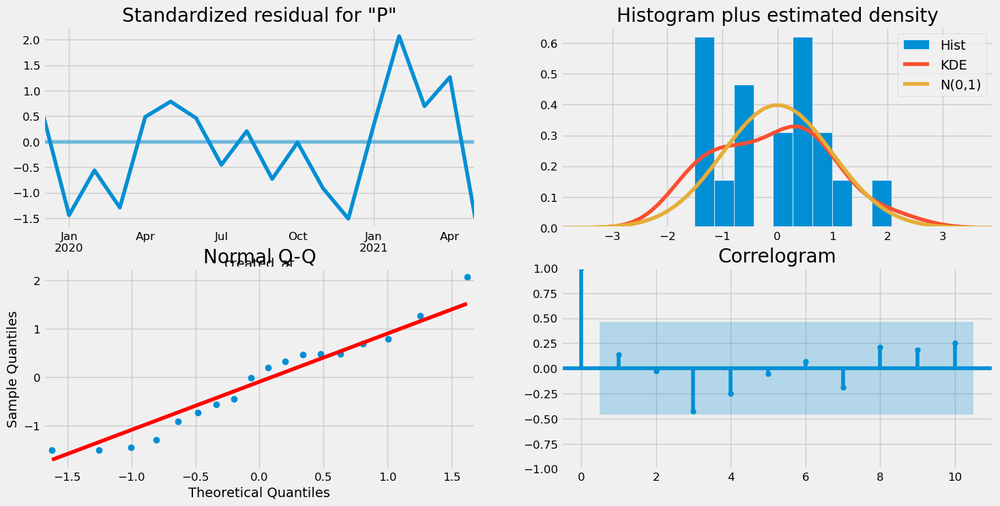

In [80]:
result.plot_diagnostics(figsize = (16, 8))
plt.show()

In [81]:
prediction = result.get_prediction(start = pd.to_datetime('2021-01-31 00:00:00+00:00'), dynamic = False)
prediction_ci = prediction.conf_int()
prediction_ci

,lower PM1.0_CF1_ug/m3,upper PM1.0_CF1_ug/m3
created_at,,
2021-01-31 00:00:00+00:00,-2.555809,5.882329
2021-02-28 00:00:00+00:00,-6.432680,2.005459
2021-03-31 00:00:00+00:00,-3.644442,4.793697
2021-04-30 00:00:00+00:00,-1.323887,7.114252
2021-05-31 00:00:00+00:00,2.857444,11.295583


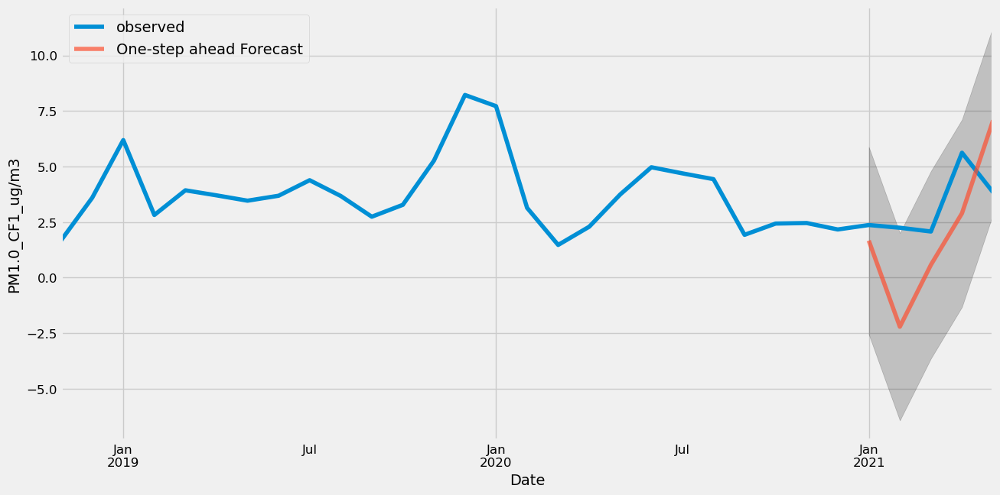

In [82]:
ax = y['2018':].plot(label = 'observed')
prediction.predicted_mean.plot(ax = ax, label = 'One-step ahead Forecast', alpha = 0.7, figsize = (14, 7))
ax.fill_between(prediction_ci.index, prediction_ci.iloc[:, 0], prediction_ci.iloc[:, 1], color = 'k', alpha = 0.2)
ax.set_xlabel("Date")
ax.set_ylabel('PM1.0_CF1_ug/m3')
plt.legend()
plt.show()

In [83]:
y_hat = prediction.predicted_mean
y_truth = y['2021-01-31 00:00:00+00:00':]

mse = ((y_hat - y_truth) ** 2).mean()
rmse = np.sqrt(mse)
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse, 2)))

The Mean Squared Error of our forecasts is 8.1
The Root Mean Squared Error of our forecasts is 2.85


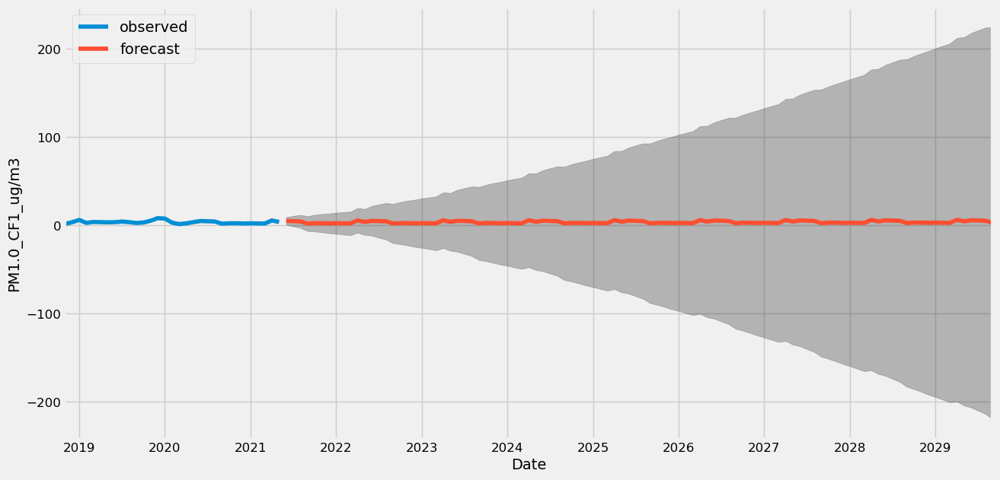

In [84]:
pred_uc = result.get_forecast(steps = 100)
pred_ci = pred_uc.conf_int()

ax = y.plot(label = 'observed', figsize = (14, 7))
pred_uc.predicted_mean.plot(ax = ax, label = 'forecast')
ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color = 'k', alpha = 0.25)
ax.set_xlabel('Date')
ax.set_ylabel('PM1.0_CF1_ug/m3')

plt.legend()
plt.show()